# **NEURAL NETWORKS AND DEEP LEARNING**

---
A.A. 2021/22 (6 CFU) - Dr. Alberto Testolin, Dr. Umberto Michieli
---

#### *Simionato Giuseppe (2029013)*

# Homework 2 - Unsupervised Deep Learning

## General overview
In this homework you will learn how to implement and test neural network models for solving unsupervised problems. For simplicity and to allow continuity with the kind of data you have seen before, the homework will be based on images of FashionMNIST. However, you can optionally explore different image collections (e.g., Caltech or Cifar) or other datasets based on your interests. The basic tasks for the homework will require to test and analyze the convolutional autoencoder implemented during the Lab practice. If you prefer, you can opt for a fully-connected autoencoder, which should achieve similar performance considering the relatively small size of the FashionMNIST images. As for the previous homework, you should explore the use of advanced optimizers and regularization methods. Learning hyperparameters should be tuned using appropriate search procedures, and final accuracy should be evaluated using a cross-validation setup. More advanced tasks will require the exploration of denoising and variational / adversarial architectures.


## Technical notes
The homework should be implemented in Python using the PyTorch framework. The  student can explore additional libraries and tools to implement the models; however, please make sure you  understand the code you are writing because during the exam you might receive specific questions related  to your implementation. The entire source code required to run the homework must be uploaded as a  compressed archive in a Moodle section dedicated to the homework. If your code will be entirely included  in a single Python notebook, just upload the notebook file.




## Final report
Along with the source code, you must separately upload a PDF file containing a Along with the source code, you must separately upload a PDF file containing a brief report of  your homework. The report should include a brief Introduction on which you explain the homework goals  and the main implementation strategies you choose, a brief Method section where you describe your  model architectures and hyperparameters, and a Result section where you present the simulation results.  Total length must not exceed 6 pages, though you can include additional tables and figures in a final  Appendix (optional). The report must be self-contained, so please make sure that all relevant results are  explicitly included in the report / notebook. 




## Grade
The maximum grade for this homework will be 8 points. Points will be assigned based on the correct  implementation of the following items: 
* 2 pt: implement and test (convolutional) autoencoder, reporting the trend of reconstruction loss and  some examples of image reconstruction; explore advanced optimizers and regularization methods 
* 1 pt: optimize hyperparameters using grid/random search or automatic tuning tools (e.g., Optuna) 
* 1 pt: fine-tune the (convolutional) autoencoder using a supervised classification task, and compare  classification accuracy and learning speed with results achieved in Homework 1 
* 2 pt: explore the latent space structure (e.g., PCA, t-SNE) and generate new samples from latent codes 
* 2 pt: implement and test variational (convolutional) autoencoder or GAN or SimCLR 



## Deadline
The complete homework (notebook or source code + report) must be submitted through Moodle at least 10 days before the chosen exam date.

# Libraries

In [2]:
!pip install trains
!pip install optuna
!pip install torchbearer

     |████████████████████████████████| 855 kB 7.0 MB/s 
     |████████████████████████████████| 86 kB 7.3 MB/s 
     |████████████████████████████████| 308 kB 7.5 MB/s 
     |████████████████████████████████| 80 kB 12.1 MB/s 
     |████████████████████████████████| 209 kB 68.5 MB/s 
     |████████████████████████████████| 75 kB 5.7 MB/s 
     |████████████████████████████████| 112 kB 76.7 MB/s 
     |████████████████████████████████| 49 kB 8.3 MB/s 
     |████████████████████████████████| 149 kB 73.9 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=5ae74b0811963168a1e9d8ffa2dde29c2f09ce693adbbe0e07fded17de32abe2
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip
     |████████████████████████████████| 138 kB 10.0 MB/s 


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import plotly.express as px
import shutil, time, os, requests, random, copy
from random import shuffle
import types

import sklearn
import sklearn.model_selection
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix

from tqdm.notebook import tqdm
import optuna
import imageio
import IPython as ip
from PIL import Image
import seaborn

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from torchsummary import summary
from torch.autograd import Variable
from torchvision.utils import make_grid
import torchbearer
import torchbearer.callbacks as callbacks
from torchbearer import Trial, state_key

from trains.automation import UniformParameterRange, UniformIntegerParameterRange
from trains.automation import HyperParameterOptimizer
from trains.automation.optuna import OptimizerOptuna

%matplotlib inline
seed = 313

In [4]:
# Check if a cuda GPU is available
if torch.cuda.is_available():
    print('GPU availble')
    # Define the device (here you can select which GPU to use if more than 1)
    device = torch.device("cuda")
else:
    print('GPU not availble')

GPU availble


# DATASET - FashionMNIST

In [44]:
#### Download the dataset

### Download the data and create dataset
data_dir = 'dataset'

train_dataset = torchvision.datasets.FashionMNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST(data_dir, train=False, download=True)

## Pre processing

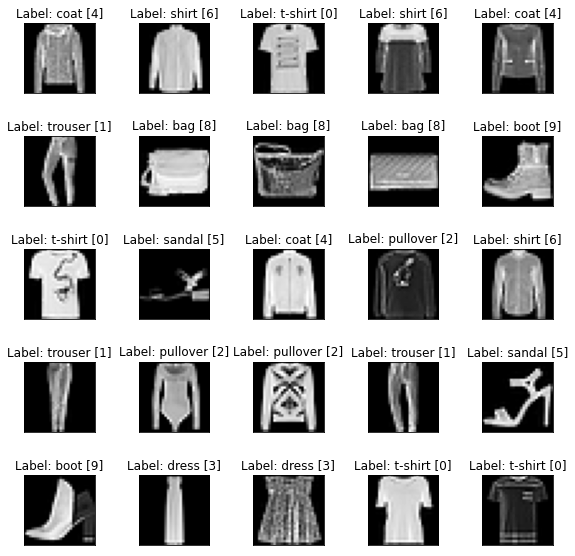

In [45]:
### Plot some samples
label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']

fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    img, label = random.choice(train_dataset)
    ax.imshow(np.array(img), cmap='gist_gray')
    ax.set_title(f'Label: {label_names[label]} [{label}]')
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [46]:
# dataset transformations
train_transform = transforms.Compose([ 
    #transforms.RandomRotation(degrees=np.random.randint(0,45)),
    transforms.RandomHorizontalFlip(p=0.3),
    transforms.ToTensor(), 
    #transforms.Normalize((0.5,), (0.5,)),
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Normalize((0.5,), (0.5,)),
])

# Set the train transform
train_dataset.transform = train_transform
# Set the test transform
test_dataset.transform = test_transform

print(train_dataset)

N = len(train_dataset)
N_train = int(0.8*len(train_dataset))
N_val = N - N_train

### split the training set in train and validation
train, val = sklearn.model_selection.train_test_split(train_dataset, test_size=N_val, train_size=N_train, 
                                             random_state=seed, shuffle=True, stratify=None)

### Define the dataloaders
batch_size = 300
num_workers = 2

train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_dataloader  = DataLoader(val, batch_size=len(val), shuffle=False, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=num_workers)


batch_data, batch_labels = next(iter(train_dataloader))
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(val_dataloader))
print(f"VAL BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: dataset
    Split: Train
TRAIN BATCH SHAPE
	 Data: torch.Size([300, 1, 28, 28])
	 Labels: torch.Size([300])
VAL BATCH SHAPE
	 Data: torch.Size([12000, 1, 28, 28])
	 Labels: torch.Size([12000])
TEST BATCH SHAPE
	 Data: torch.Size([10000, 1, 28, 28])
	 Labels: torch.Size([10000])


# AUTOENCODER

## Model definition

In [35]:
### Encoder part

class Encoder(nn.Module):
    
    def __init__(self, chs=(1,32,128,288,2),  p=0.25):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            # first conv block
            nn.Conv2d(in_channels=chs[0], out_channels=chs[1], kernel_size=(3,3), padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=chs[1]),
            nn.MaxPool2d((2,2), stride=2),
            # second conv block
            nn.Conv2d(in_channels=chs[1], out_channels=chs[2], kernel_size=(3,3), padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(num_features=chs[2]),
            nn.MaxPool2d((2,2))
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(in_features=chs[2]*7*7, out_features=chs[3]),
            nn.Dropout2d(p),
            nn.ReLU(True),
            nn.Linear(in_features=chs[3], out_features=chs[4])
        )
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.encoder_lin(x)
        return x

### Decoder part

class Decoder(nn.Module):
    
    def __init__(self, chs=(2, 288, 128, 32, 1), p=0.25):
        super().__init__()

        ### Linear section
        self.decoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(in_features=chs[0], out_features=288),
            nn.Dropout2d(p),
            nn.ReLU(True),
        )

        ### Unflatten
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        ### Convolutional section
        self.decoder_conv = nn.Sequential(
            # first deconv block 
            nn.ConvTranspose2d(in_channels=32, out_channels=chs[1], kernel_size=(3,3), 
                               stride=2, output_padding=0),
            nn.ReLU(True),
            # second deconv block
            nn.ConvTranspose2d(in_channels=chs[1], out_channels=chs[2], kernel_size=(3,3), 
                               stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            # final deconv block
            nn.ConvTranspose2d(in_channels=chs[2], out_channels=chs[4], kernel_size=(3,3), 
                               stride=2, padding=1, output_padding=1),
            nn.Sigmoid(),
        )
        
    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        # Unflatten
        x = self.unflatten(x)
        # Apply transposed convolutions
        x = self.decoder_conv(x)
        return x


In [36]:
### Dimension check

### Set the random seed for reproducible results
torch.manual_seed(seed)

latent_space_dim = 100 #18

### Initialize the two networks
encoder = Encoder(chs=(1,8,16,32,latent_space_dim))
decoder = Decoder(chs=(latent_space_dim, 32, 16, 8, 1))

# Take an input image (remember to add the batch dimension)
img, _ = test_dataset[0]
img = img.unsqueeze(0) # Add the batch dimension in the first axis
print('Original image shape:', img.shape)

# Encode the image
img_enc = encoder(img)
print('Encoded image shape:', img_enc.shape)

# Decode the image
dec_img = decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

Original image shape: torch.Size([1, 1, 28, 28])
Encoded image shape: torch.Size([1, 100])
Decoded image shape: torch.Size([1, 1, 28, 28])


## Training and optimization

In [42]:
### Useful functions

### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in tqdm(dataloader):
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        #print('\t partial train loss (single batch): %f' % (loss.data))
    return loss.data

### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in tqdm(dataloader):
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

### Model inizialization

In [ ]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 5e-4 # Learning rate
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
opt = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-5)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

summary(encoder, (1,28,28))

Selected device: cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 28, 28]              80
              ReLU-2            [-1, 8, 28, 28]               0
       BatchNorm2d-3            [-1, 8, 28, 28]              16
         MaxPool2d-4            [-1, 8, 14, 14]               0
            Conv2d-5           [-1, 16, 14, 14]           1,168
              ReLU-6           [-1, 16, 14, 14]               0
       BatchNorm2d-7           [-1, 16, 14, 14]              32
         MaxPool2d-8             [-1, 16, 7, 7]               0
           Flatten-9                  [-1, 784]               0
           Linear-10                   [-1, 32]          25,120
        Dropout2d-11                   [-1, 32]               0
             ReLU-12                   [-1, 32]               0
           Linear-13                  [-1, 100]           3,300
Total params: 29,

### Training loop

EPOCH 1/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/10 - loss: 0.044635




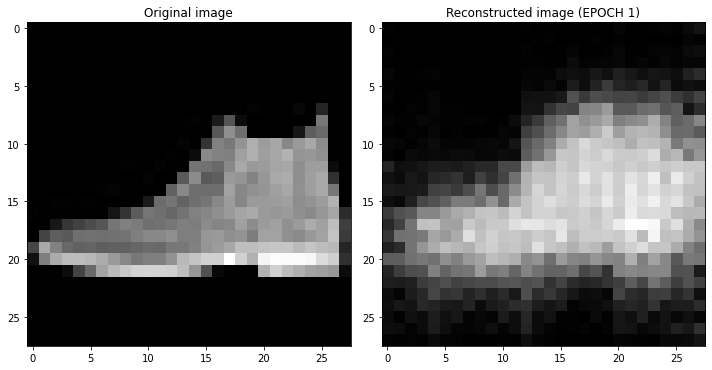

EPOCH 2/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/10 - loss: 0.029593




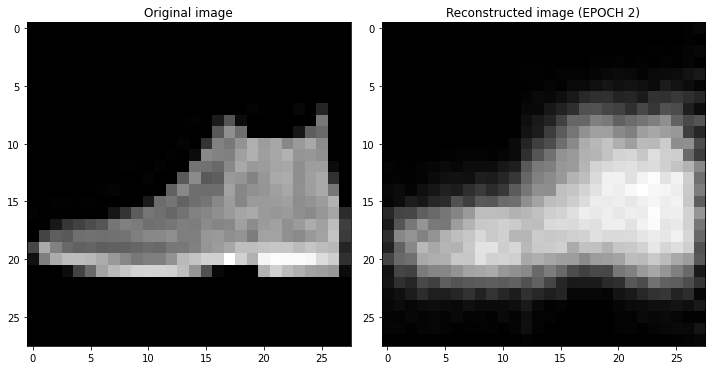

EPOCH 3/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/10 - loss: 0.026705




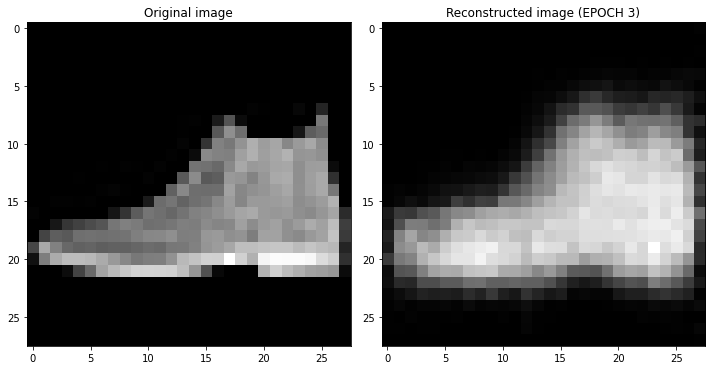

EPOCH 4/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/10 - loss: 0.025217




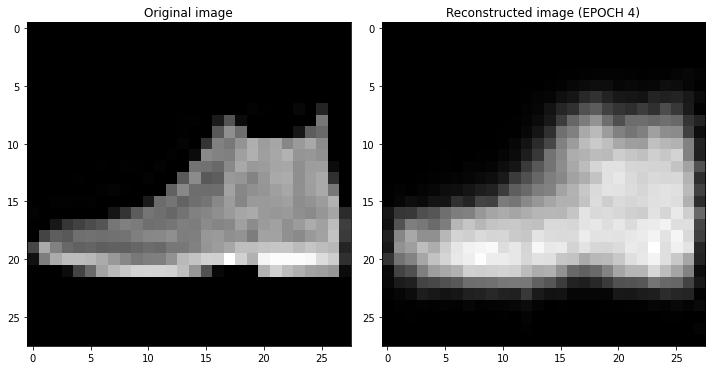

EPOCH 5/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/10 - loss: 0.024294




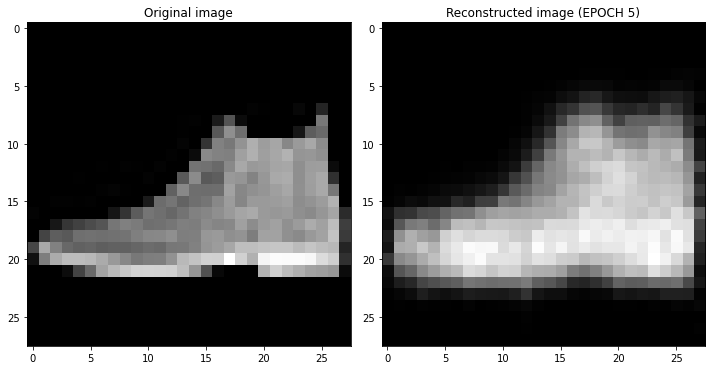

EPOCH 6/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 6/10 - loss: 0.023687




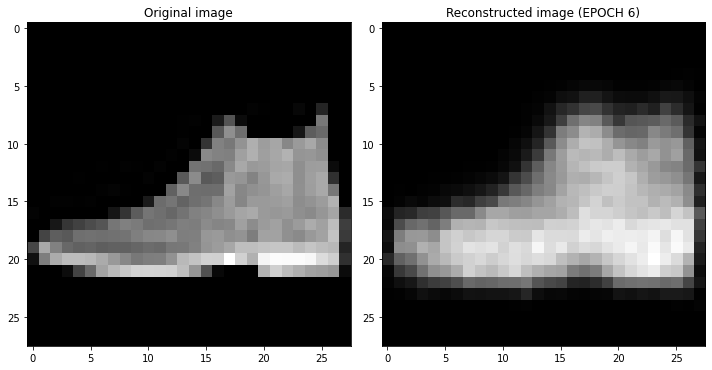

EPOCH 7/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 7/10 - loss: 0.023193




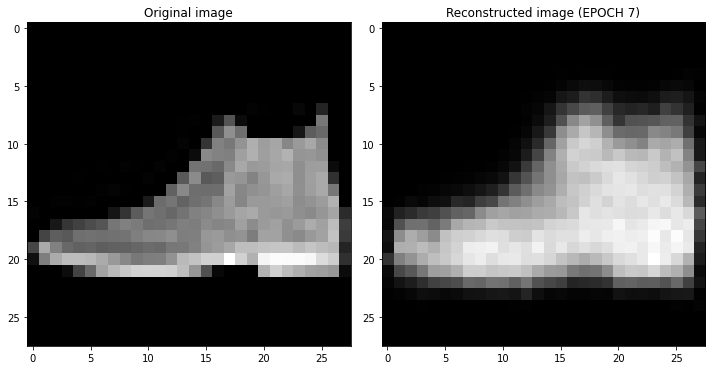

EPOCH 8/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 8/10 - loss: 0.022788




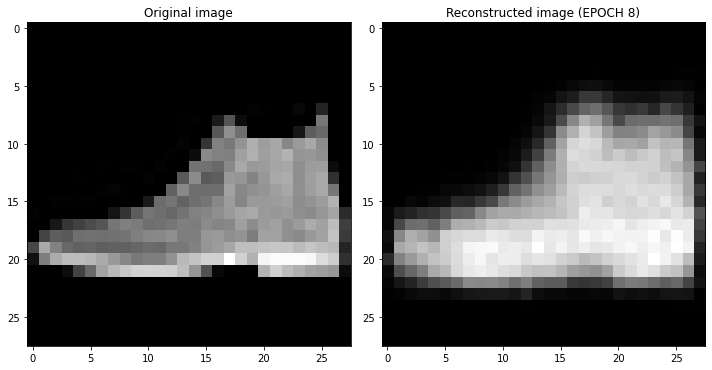

EPOCH 9/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 9/10 - loss: 0.022390




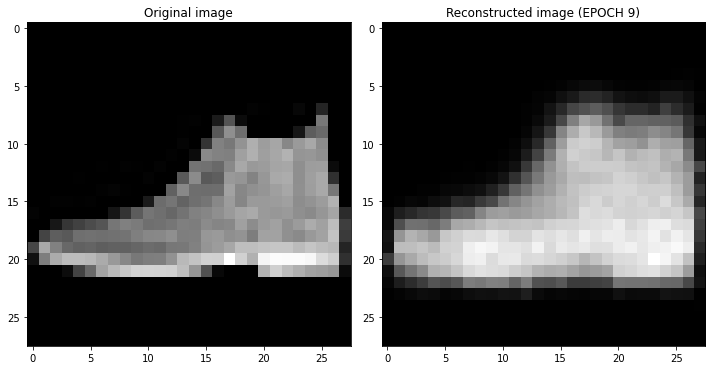

EPOCH 10/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 10/10 - loss: 0.022547




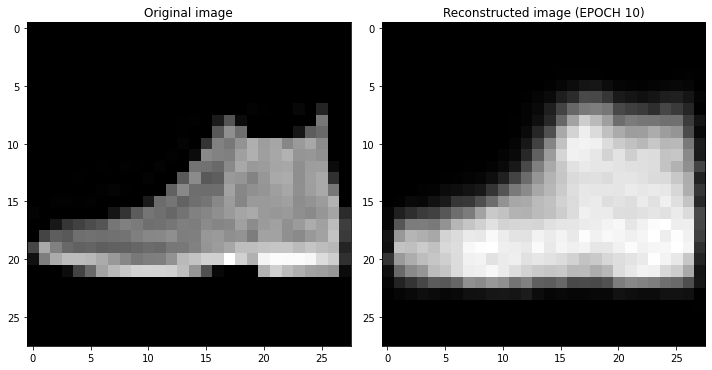

In [ ]:
### Training cycle
num_epochs = 10

for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    _ = train_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=opt)
    ### Validation  (use the testing function)
    val_loss = test_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=val_dataloader, 
        loss_fn=loss_fn)
    # Print Validationloss
    print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

    ### Plot progress
    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(10,5))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[0].set_title('Original image')
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
    plt.tight_layout()
    plt.pause(0.1)
    # Save figures
    #os.makedirs('autoencoder_progress_%d_features' % latent_space_dim, exist_ok=True)
    #fig.savefig('autoencoder_progress_%d_features/epoch_%d.jpg' % (latent_space_dim, epoch + 1))
    plt.show()
    plt.close()

    # Save network parameters
    torch.save(encoder.state_dict(), 'encoder_params.pth')
    torch.save(decoder.state_dict(), 'decoder_params.pth')

### Hyper-parameters optimization

[I 2021-12-29 08:48:44,725] A new study created in memory with name: no-name-5260cc07-6126-410e-929a-a31725164c4e


EPOCH 1/5
EPOCH 1/5


/opt/conda/lib/python3.7/site-packages/optuna/study/study.py:397: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  FutureWarning,


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/353 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.023919


EPOCH 2/5


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.028754


EPOCH 2/5


  0%|          | 0/353 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.020761


EPOCH 3/5


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.027666


EPOCH 3/5


  0%|          | 0/353 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.019519


EPOCH 4/5


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.018319


EPOCH 5/5


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.025700


EPOCH 4/5


  0%|          | 0/353 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.017241




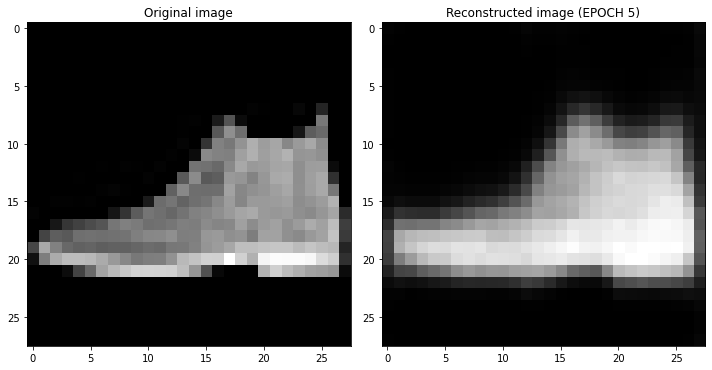

[I 2021-12-29 08:49:20,371] Trial 1 finished with value: 0.017241159453988075 and parameters: {'latent_space_dim': 98, 'batch_size': 192, 'p': 0.05, 'lr': 0.002, 'weight_decay': 0.0001}. Best is trial 1 with value: 0.017241159453988075.


EPOCH 1/5


  0%|          | 0/215 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.029023


EPOCH 5/5


  0%|          | 0/353 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.045249


EPOCH 2/5


  0%|          | 0/215 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.040292


EPOCH 3/5


  0%|          | 0/215 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.024781




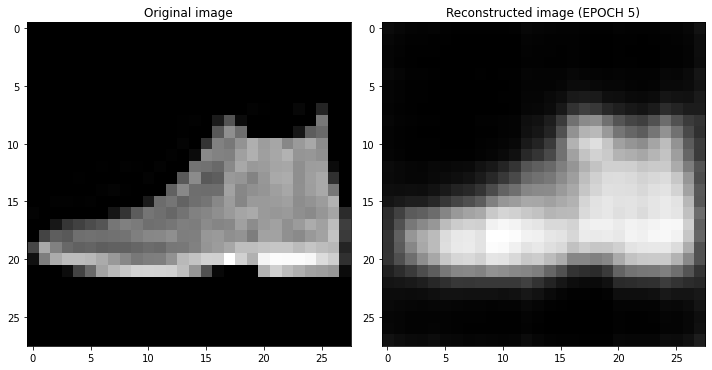

[I 2021-12-29 08:49:34,676] Trial 0 finished with value: 0.024780552834272385 and parameters: {'latent_space_dim': 40, 'batch_size': 136, 'p': 0.05, 'lr': 0.0035, 'weight_decay': 0.0005}. Best is trial 1 with value: 0.017241159453988075.


EPOCH 1/5


  0%|          | 0/1200 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.036938


EPOCH 4/5


  0%|          | 0/215 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.036745


EPOCH 5/5


  0%|          | 0/215 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.036754




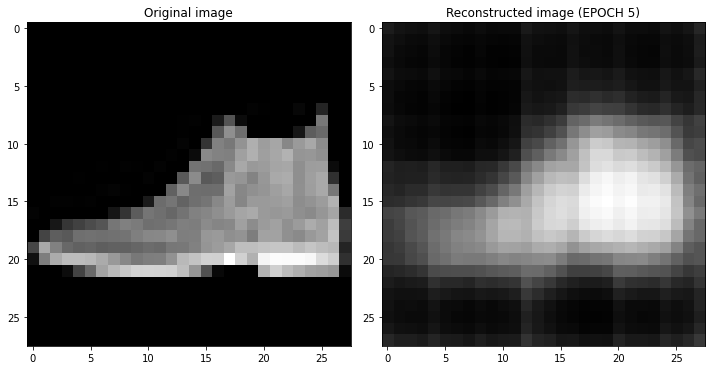

[I 2021-12-29 08:49:50,432] Trial 2 finished with value: 0.036754060536623 and parameters: {'latent_space_dim': 36, 'batch_size': 224, 'p': 0.35000000000000003, 'lr': 0.007000000000000001, 'weight_decay': 0.001}. Best is trial 1 with value: 0.017241159453988075.


EPOCH 1/5


  0%|          | 0/273 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.033865


EPOCH 2/5


  0%|          | 0/273 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.032122


EPOCH 2/5


  0%|          | 0/1200 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.030851


EPOCH 3/5


  0%|          | 0/273 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.030631


EPOCH 4/5


  0%|          | 0/273 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.029820


EPOCH 5/5


  0%|          | 0/273 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.029673




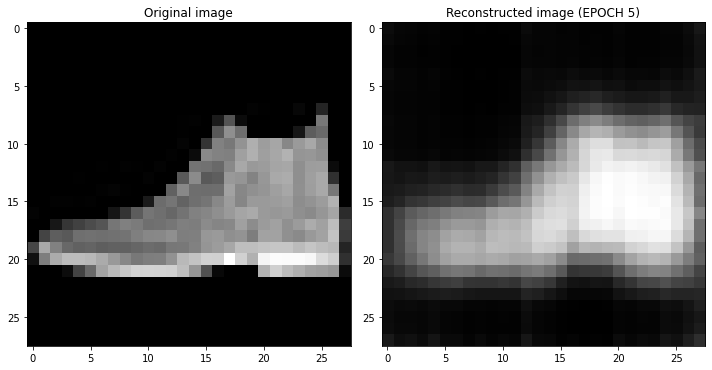

[I 2021-12-29 08:50:23,391] Trial 4 finished with value: 0.029673131182789803 and parameters: {'latent_space_dim': 94, 'batch_size': 176, 'p': 0.30000000000000004, 'lr': 0.001, 'weight_decay': 0.0005}. Best is trial 1 with value: 0.017241159453988075.


EPOCH 1/5


  0%|          | 0/197 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.031034


EPOCH 3/5


  0%|          | 0/1200 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.027663


EPOCH 2/5


  0%|          | 0/197 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.027173


EPOCH 3/5


  0%|          | 0/197 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.026403


EPOCH 4/5


  0%|          | 0/197 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.026115


EPOCH 5/5


  0%|          | 0/197 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.025585




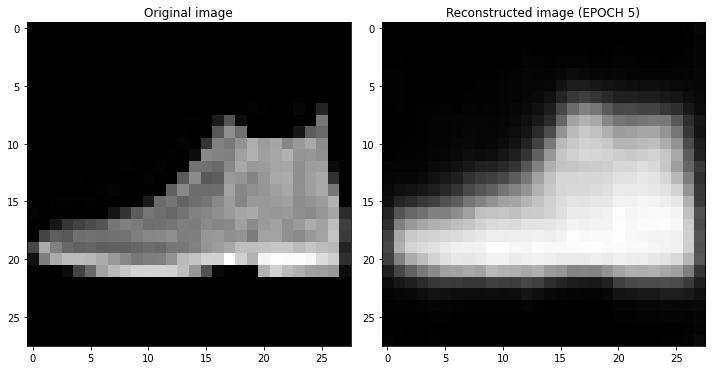

[I 2021-12-29 08:50:51,225] Trial 5 finished with value: 0.025585217401385307 and parameters: {'latent_space_dim': 54, 'batch_size': 244, 'p': 0.25, 'lr': 0.009000000000000001, 'weight_decay': 0.0001}. Best is trial 1 with value: 0.017241159453988075.


EPOCH 1/5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.030678


EPOCH 4/5


  0%|          | 0/1200 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.017538


EPOCH 2/5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.030266


EPOCH 5/5


  0%|          | 0/1200 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.014448


EPOCH 3/5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.032963




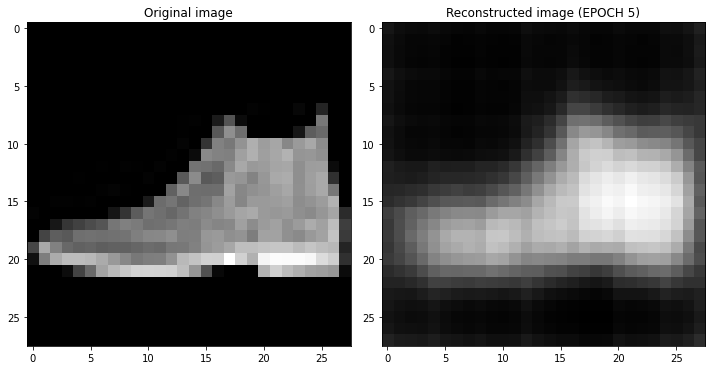

[I 2021-12-29 08:51:41,204] Trial 3 finished with value: 0.03296311944723129 and parameters: {'latent_space_dim': 50, 'batch_size': 40, 'p': 0.2, 'lr': 0.0075, 'weight_decay': 0.0005}. Best is trial 1 with value: 0.017241159453988075.


EPOCH 1/5


  0%|          | 0/546 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.013505


EPOCH 4/5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.034925


EPOCH 2/5


  0%|          | 0/546 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.028836


EPOCH 3/5


  0%|          | 0/546 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.013565


EPOCH 5/5


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.036161


EPOCH 4/5


  0%|          | 0/546 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.027527


EPOCH 5/5


  0%|          | 0/546 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.012539




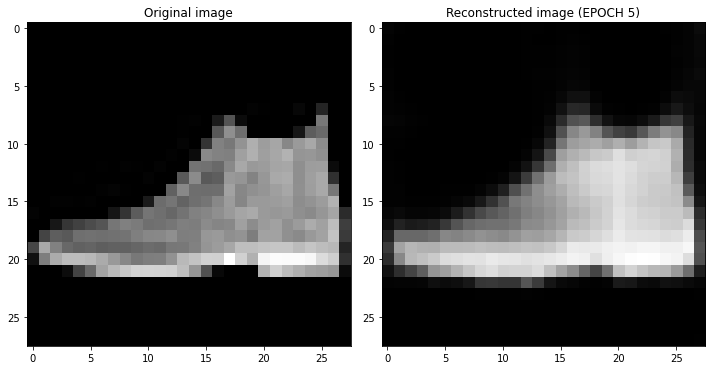

[I 2021-12-29 08:52:29,485] Trial 6 finished with value: 0.012539362534880638 and parameters: {'latent_space_dim': 38, 'batch_size': 48, 'p': 0.0, 'lr': 0.002, 'weight_decay': 5e-05}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/261 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.023968


EPOCH 2/5


  0%|          | 0/261 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.029926




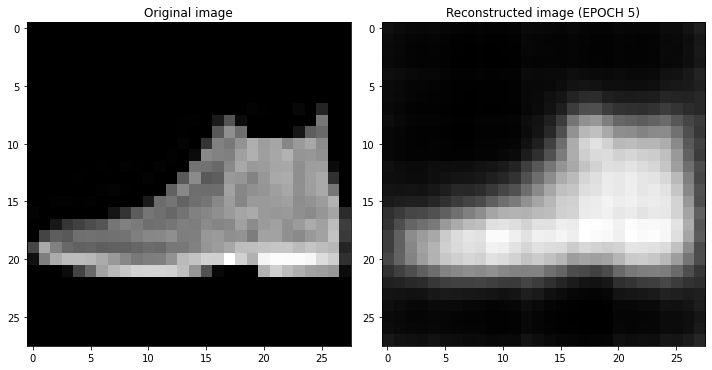

[I 2021-12-29 08:52:36,654] Trial 7 finished with value: 0.02992631308734417 and parameters: {'latent_space_dim': 34, 'batch_size': 88, 'p': 0.1, 'lr': 0.008, 'weight_decay': 0.0005}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/750 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.022056


EPOCH 3/5


  0%|          | 0/261 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.020056


EPOCH 4/5


  0%|          | 0/261 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.034526


EPOCH 2/5


  0%|          | 0/750 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.020776


EPOCH 5/5


  0%|          | 0/261 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.019545




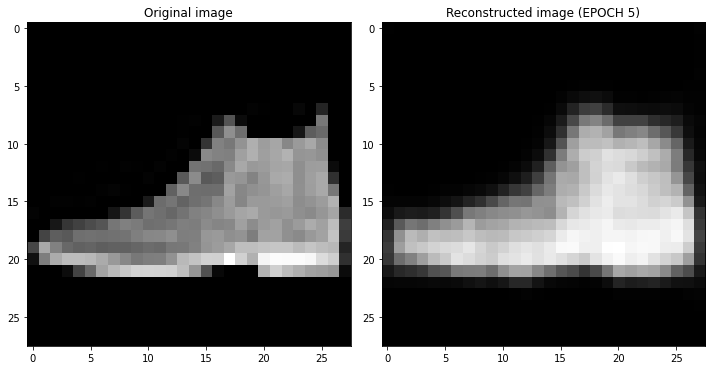

[I 2021-12-29 08:53:05,917] Trial 8 finished with value: 0.019545400515198708 and parameters: {'latent_space_dim': 6, 'batch_size': 184, 'p': 0.0, 'lr': 0.0055, 'weight_decay': 5e-05}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/462 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.033214


EPOCH 3/5


  0%|          | 0/750 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.035339


EPOCH 2/5


  0%|          | 0/462 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.034390


EPOCH 3/5


  0%|          | 0/462 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.036044


EPOCH 4/5


  0%|          | 0/750 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.033885


EPOCH 4/5


  0%|          | 0/462 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.033676


EPOCH 5/5


  0%|          | 0/462 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.033176


EPOCH 5/5


  0%|          | 0/750 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.032615




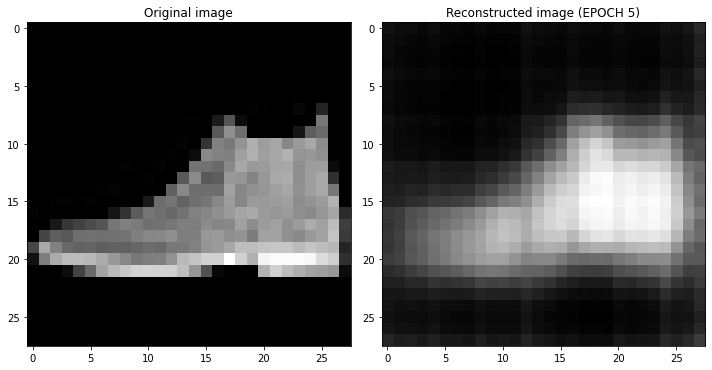

[I 2021-12-29 08:54:02,622] Trial 10 finished with value: 0.03261531516909599 and parameters: {'latent_space_dim': 74, 'batch_size': 104, 'p': 0.2, 'lr': 0.002, 'weight_decay': 0.001}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.032794




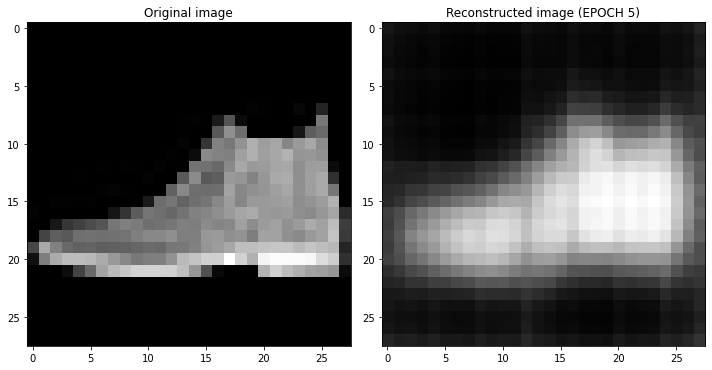

[I 2021-12-29 08:54:08,397] Trial 9 finished with value: 0.03279351070523262 and parameters: {'latent_space_dim': 36, 'batch_size': 64, 'p': 0.15000000000000002, 'lr': 0.005000000000000001, 'weight_decay': 0.001}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.032076


EPOCH 2/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.026518


EPOCH 3/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.023212


EPOCH 4/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.021167


EPOCH 5/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.019905




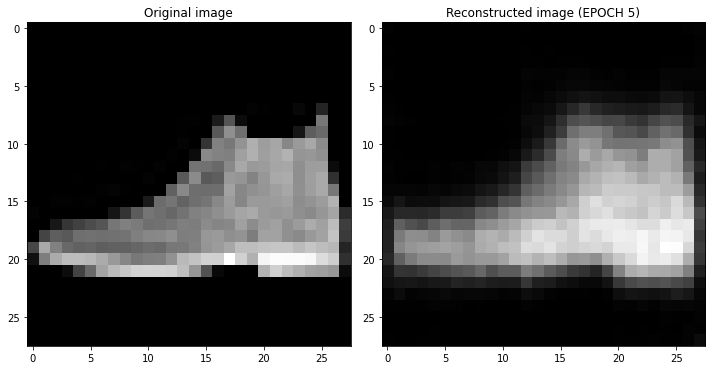

[I 2021-12-29 08:54:35,142] Trial 12 finished with value: 0.019905326887965202 and parameters: {'latent_space_dim': 96, 'batch_size': 296, 'p': 0.0, 'lr': 0.0005, 'weight_decay': 0.0001}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/2400 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.030100


EPOCH 2/5


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.021141


EPOCH 2/5


  0%|          | 0/2400 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.029192


EPOCH 3/5


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.020753


EPOCH 3/5


  0%|          | 0/2400 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.028881


EPOCH 4/5


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.029493


EPOCH 5/5


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.019982


EPOCH 4/5


  0%|          | 0/2400 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.028249




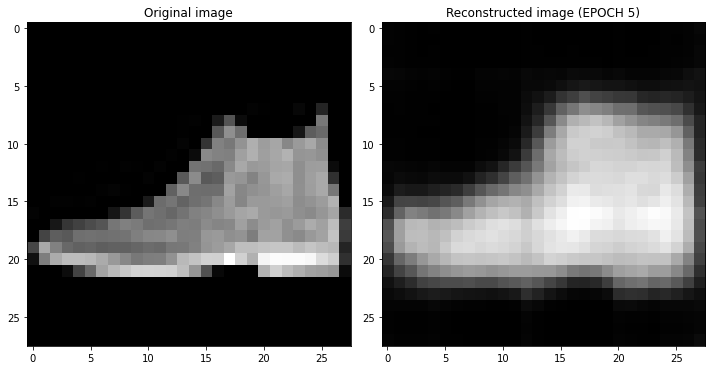

[I 2021-12-29 08:57:18,043] Trial 11 finished with value: 0.0282491035759449 and parameters: {'latent_space_dim': 10, 'batch_size': 24, 'p': 0.4, 'lr': 0.004, 'weight_decay': 5e-05}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/364 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.022988


EPOCH 2/5


  0%|          | 0/364 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.019779


EPOCH 5/5


  0%|          | 0/2400 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.020865


EPOCH 3/5


  0%|          | 0/364 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.019766


EPOCH 4/5


  0%|          | 0/364 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.019400


EPOCH 5/5


  0%|          | 0/364 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.018961




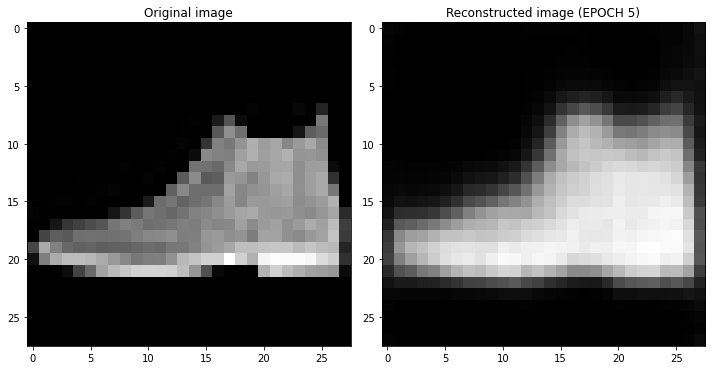

[I 2021-12-29 08:58:03,810] Trial 14 finished with value: 0.018960926681756973 and parameters: {'latent_space_dim': 72, 'batch_size': 132, 'p': 0.1, 'lr': 0.0025, 'weight_decay': 0.0001}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/223 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.023779


EPOCH 2/5


  0%|          | 0/223 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.020466


EPOCH 3/5


  0%|          | 0/223 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.018612


EPOCH 4/5


  0%|          | 0/223 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.017998


EPOCH 5/5


  0%|          | 0/223 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.019812




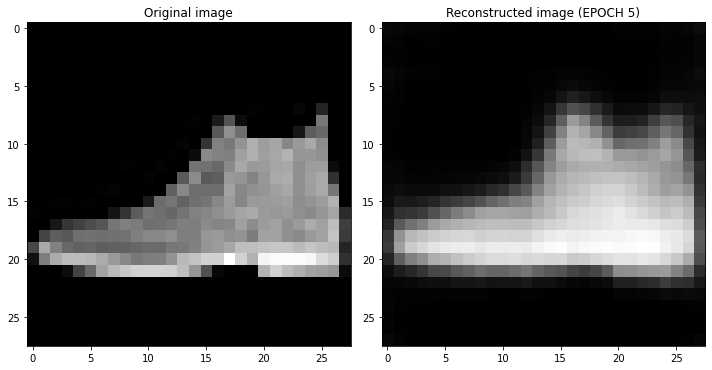

[I 2021-12-29 08:58:27,805] Trial 13 finished with value: 0.01981169357895851 and parameters: {'latent_space_dim': 12, 'batch_size': 20, 'p': 0.1, 'lr': 0.003, 'weight_decay': 5e-05}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/219 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.017639




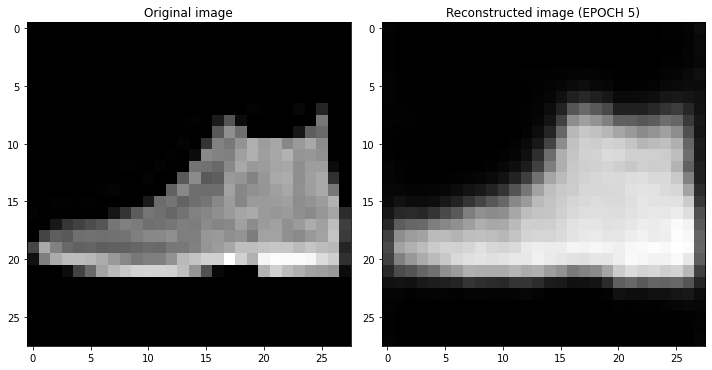

[I 2021-12-29 08:58:33,085] Trial 15 finished with value: 0.017639117315411568 and parameters: {'latent_space_dim': 20, 'batch_size': 216, 'p': 0.05, 'lr': 0.002, 'weight_decay': 5e-05}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.024949


EPOCH 2/5


  0%|          | 0/219 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.022868


EPOCH 2/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.020347


EPOCH 3/5


  0%|          | 0/219 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.020590


EPOCH 3/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.018063


EPOCH 4/5


  0%|          | 0/219 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.017690


EPOCH 4/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.016252


EPOCH 5/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.016827


EPOCH 5/5


  0%|          | 0/219 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.015984




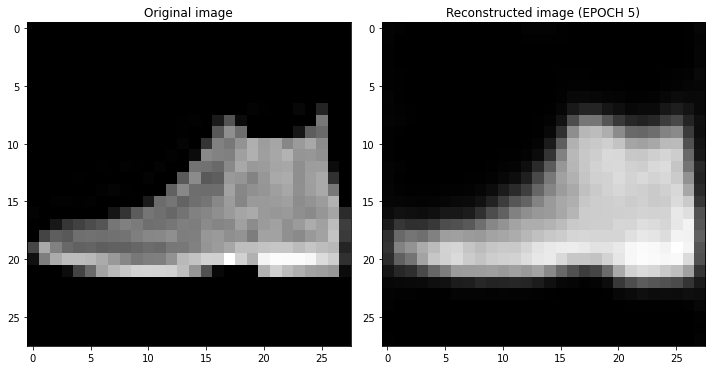

[I 2021-12-29 08:59:04,709] Trial 17 finished with value: 0.01598418317735195 and parameters: {'latent_space_dim': 72, 'batch_size': 288, 'p': 0.0, 'lr': 0.005000000000000001, 'weight_decay': 0.0001}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.016704




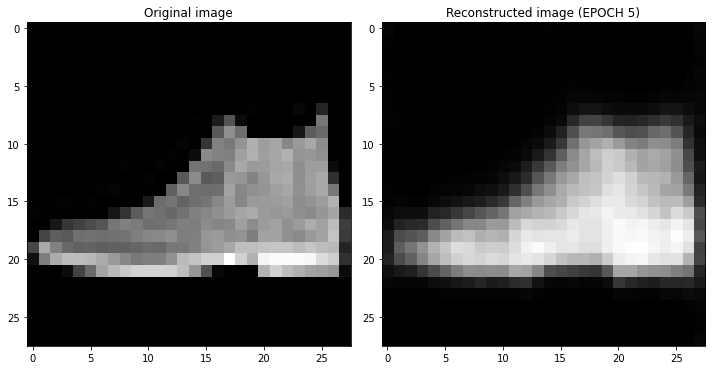

[I 2021-12-29 08:59:07,330] Trial 16 finished with value: 0.0167036522179842 and parameters: {'latent_space_dim': 74, 'batch_size': 220, 'p': 0.0, 'lr': 0.0015, 'weight_decay': 0.0001}. Best is trial 6 with value: 0.012539362534880638.


EPOCH 1/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.021981


EPOCH 2/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/5 - loss: 0.025375


EPOCH 2/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.017978


EPOCH 3/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/5 - loss: 0.022339


EPOCH 3/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.016516


EPOCH 4/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/5 - loss: 0.020784


EPOCH 4/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.015147


EPOCH 5/5


  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/5 - loss: 0.027488


EPOCH 5/5


  0%|          | 0/163 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.014182




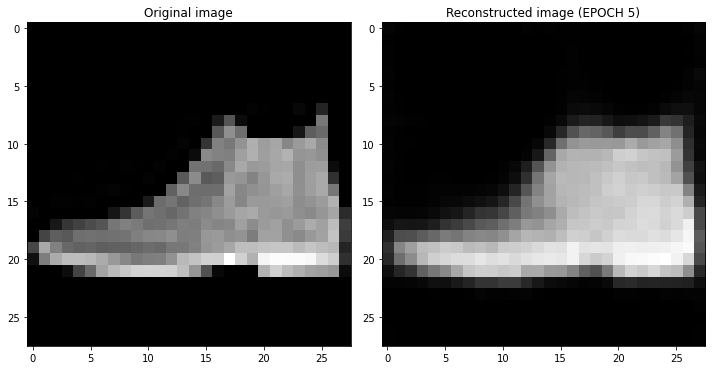

[I 2021-12-29 08:59:37,717] Trial 18 finished with value: 0.014182417653501034 and parameters: {'latent_space_dim': 76, 'batch_size': 288, 'p': 0.0, 'lr': 0.0055, 'weight_decay': 5e-05}. Best is trial 6 with value: 0.012539362534880638.


  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/5 - loss: 0.020240




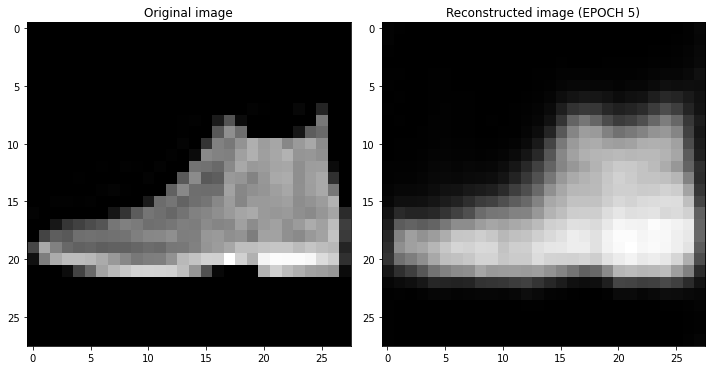

[I 2021-12-29 08:59:39,120] Trial 19 finished with value: 0.020239898934960365 and parameters: {'latent_space_dim': 60, 'batch_size': 296, 'p': 0.15000000000000002, 'lr': 0.006, 'weight_decay': 5e-05}. Best is trial 6 with value: 0.012539362534880638.
/opt/conda/lib/python3.7/site-packages/optuna/structs.py:18: FutureWarning: `structs` is deprecated. Classes have moved to the following modules. `structs.StudyDirection`->`study.StudyDirection`, `structs.StudySummary`->`study.StudySummary`, `structs.FrozenTrial`->`trial.FrozenTrial`, `structs.TrialState`->`trial.TrialState`, `structs.TrialPruned`->`exceptions.TrialPruned`.
  warnings.warn(_message, FutureWarning)


In [ ]:
def objective(trial):

    # hyperparameters to optimize
    hyper_parameters=[
        trial.suggest_int('latent_space_dim', 2, 100, 2),
        trial.suggest_int('batch_size', 20, 300, 4),
        trial.suggest_discrete_uniform("p", 0.0, 0.4, 0.05),
        trial.suggest_discrete_uniform("lr", 0.0005, 0.01, 0.0005),
        trial.suggest_categorical("weight_decay", [5e-5, 1e-4, 5e-4, 1e-3]),
    ]

    ###########################################################################################################

    # Define the dataloaders
    batch_size = hyper_parameters[1]

    train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_dataloader  = DataLoader(val, batch_size=len(val), shuffle=False, num_workers=num_workers)

    torch.manual_seed(seed)

    latent_space_dim = hyper_parameters[0]

    ### Initialize the two networks
    encoder = Encoder(chs=(1,8,16,32,latent_space_dim), p= hyper_parameters[2])
    decoder = Decoder(chs=(latent_space_dim, 32, 16, 8, 1), p=hyper_parameters[2])

    ### Define the loss function
    loss_fn = torch.nn.MSELoss()

    ### Define an optimizer (both for the encoder and the decoder!)
    lr = hyper_parameters[3] # Learning rate
    params_to_optimize = [
        {'params': encoder.parameters()},
        {'params': decoder.parameters()}
    ]
    opt = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=hyper_parameters[4])

    # Check if the GPU is available
    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    #print(f'Selected device: {device}')

    # Move both the encoder and the decoder to the selected device
    encoder.to(device)
    decoder.to(device)

    ###########################################################################################################

    ### Training loop
    num_epochs = 5

    for epoch in range(num_epochs):
      print('EPOCH %d/%d' % (epoch + 1, num_epochs))
      ### Training (use the training function)
      _ = train_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=train_dataloader, 
          loss_fn=loss_fn, 
          optimizer=opt)
      ### Validation  (use the testing function)
      val_loss = test_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=val_dataloader, 
          loss_fn=loss_fn)
      # Print Validationloss
      print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

      if epoch == num_epochs-1 :
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        encoder.eval()
        decoder.eval()
        with torch.no_grad():
            rec_img  = decoder(encoder(img))
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 2, figsize=(10,5))
        axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        # Save figures
        #os.makedirs('autoencoder_progress_%d_features' % latent_space_dim, exist_ok=True)
        #fig.savefig('autoencoder_progress_%d_features/epoch_%d.jpg' % (latent_space_dim, epoch + 1))
        plt.show()
        plt.close()

      # Save network parameters
      #torch.save(encoder.state_dict(), 'encoder_params.pth')
      #torch.save(decoder.state_dict(), 'decoder_params.pth')


    return val_loss

study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=20, n_jobs=2)

pruned_trials = [t for t in study.trials if t.state == optuna.structs.TrialState.PRUNED]
complete_trials = [t for t in study.trials if t.state == optuna.structs.TrialState.COMPLETE]

In [ ]:
print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
  print("    {}: {}".format(key, value))

autoencoder_LSdim = trial.params['latent_space_dim']

Study statistics: 
  Number of finished trials:  20
  Number of pruned trials:  0
  Number of complete trials:  20
Best trial:
  Value:  0.012539362534880638
  Params: 
    latent_space_dim: 38
    batch_size: 48
    p: 0.0
    lr: 0.002
    weight_decay: 5e-05


### K-fold cross validation

--------------------------------
FOLD 1
--------------------------------
EPOCH 1/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/20 - loss: 0.024207


EPOCH 2/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/20 - loss: 0.020669


EPOCH 3/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/20 - loss: 0.020507


EPOCH 4/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/20 - loss: 0.019264


EPOCH 5/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/20 - loss: 0.016202


EPOCH 6/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 6/20 - loss: 0.015390


EPOCH 7/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 7/20 - loss: 0.014780


EPOCH 8/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 8/20 - loss: 0.014857


EPOCH 9/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 9/20 - loss: 0.014561


EPOCH 10/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 10/20 - loss: 0.014036


EPOCH 11/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 11/20 - loss: 0.013690


EPOCH 12/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 12/20 - loss: 0.013595


EPOCH 13/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 13/20 - loss: 0.013789


EPOCH 14/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 14/20 - loss: 0.013851


EPOCH 15/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 15/20 - loss: 0.013101


EPOCH 16/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 16/20 - loss: 0.013461


EPOCH 17/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 17/20 - loss: 0.013084


EPOCH 18/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 18/20 - loss: 0.012975


EPOCH 19/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 19/20 - loss: 0.012858


EPOCH 20/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 20/20 - loss: 0.012928




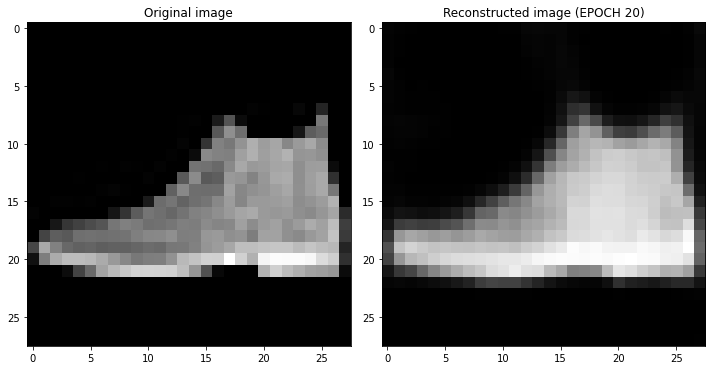



	 TRAINING - FOLD 1/5 - loss: 0.015 
	 VALIDATION   - FOLD 1/5 - loss: 0.013


--------------------------------
FOLD 2
--------------------------------
EPOCH 1/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/20 - loss: 0.026170


EPOCH 2/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/20 - loss: 0.020497


EPOCH 3/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/20 - loss: 0.018310


EPOCH 4/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/20 - loss: 0.018198


EPOCH 5/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/20 - loss: 0.016114


EPOCH 6/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 6/20 - loss: 0.015555


EPOCH 7/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 7/20 - loss: 0.015088


EPOCH 8/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 8/20 - loss: 0.014652


EPOCH 9/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 9/20 - loss: 0.015322


EPOCH 10/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 10/20 - loss: 0.014040


EPOCH 11/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 11/20 - loss: 0.014184


EPOCH 12/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 12/20 - loss: 0.013639


EPOCH 13/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 13/20 - loss: 0.014021


EPOCH 14/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 14/20 - loss: 0.013196


EPOCH 15/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 15/20 - loss: 0.013562


EPOCH 16/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 16/20 - loss: 0.013146


EPOCH 17/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 17/20 - loss: 0.013017


EPOCH 18/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 18/20 - loss: 0.012779


EPOCH 19/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 19/20 - loss: 0.012634


EPOCH 20/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 20/20 - loss: 0.012773




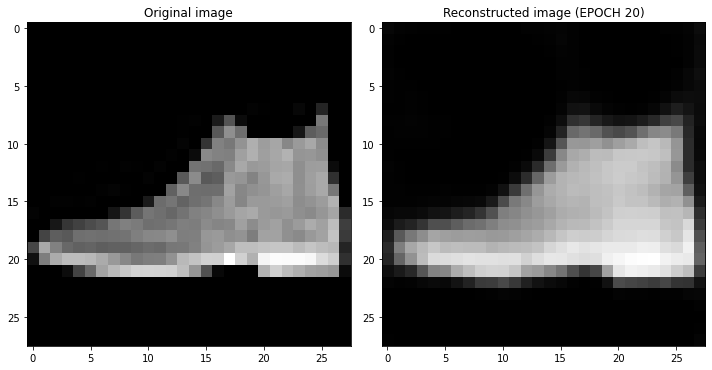



	 TRAINING - FOLD 2/5 - loss: 0.013 
	 VALIDATION   - FOLD 2/5 - loss: 0.013


--------------------------------
FOLD 3
--------------------------------
EPOCH 1/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/20 - loss: 0.023686


EPOCH 2/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/20 - loss: 0.019604


EPOCH 3/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/20 - loss: 0.018229


EPOCH 4/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/20 - loss: 0.016646


EPOCH 5/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/20 - loss: 0.015966


EPOCH 6/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 6/20 - loss: 0.015245


EPOCH 7/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 7/20 - loss: 0.014975


EPOCH 8/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 8/20 - loss: 0.014560


EPOCH 9/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 9/20 - loss: 0.014591


EPOCH 10/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 10/20 - loss: 0.014013


EPOCH 11/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 11/20 - loss: 0.013622


EPOCH 12/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 12/20 - loss: 0.013692


EPOCH 13/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 13/20 - loss: 0.013407


EPOCH 14/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 14/20 - loss: 0.013210


EPOCH 15/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 15/20 - loss: 0.012877


EPOCH 16/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 16/20 - loss: 0.013092


EPOCH 17/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 17/20 - loss: 0.013289


EPOCH 18/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 18/20 - loss: 0.012873


EPOCH 19/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 19/20 - loss: 0.012658


EPOCH 20/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 20/20 - loss: 0.012753




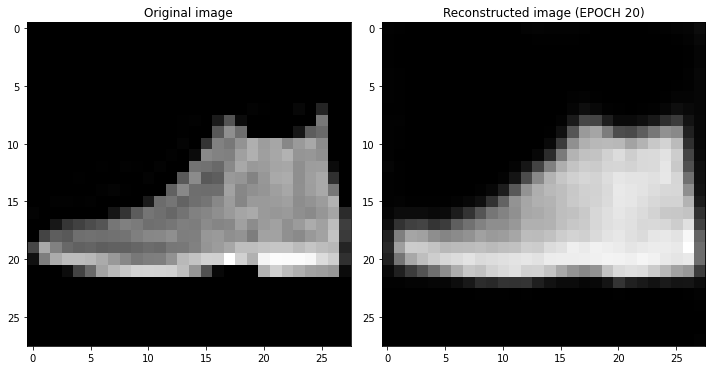



	 TRAINING - FOLD 3/5 - loss: 0.014 
	 VALIDATION   - FOLD 3/5 - loss: 0.013


--------------------------------
FOLD 4
--------------------------------
EPOCH 1/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/20 - loss: 0.023718


EPOCH 2/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/20 - loss: 0.019557


EPOCH 3/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/20 - loss: 0.018259


EPOCH 4/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/20 - loss: 0.016778


EPOCH 5/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/20 - loss: 0.016147


EPOCH 6/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 6/20 - loss: 0.015623


EPOCH 7/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 7/20 - loss: 0.014943


EPOCH 8/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 8/20 - loss: 0.014701


EPOCH 9/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 9/20 - loss: 0.013871


EPOCH 10/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 10/20 - loss: 0.014262


EPOCH 11/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 11/20 - loss: 0.014193


EPOCH 12/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 12/20 - loss: 0.014425


EPOCH 13/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 13/20 - loss: 0.014168


EPOCH 14/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 14/20 - loss: 0.014344


EPOCH 15/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 15/20 - loss: 0.013168


EPOCH 16/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 16/20 - loss: 0.013058


EPOCH 17/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 17/20 - loss: 0.013115


EPOCH 18/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 18/20 - loss: 0.013020


EPOCH 19/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 19/20 - loss: 0.013034


EPOCH 20/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 20/20 - loss: 0.012569




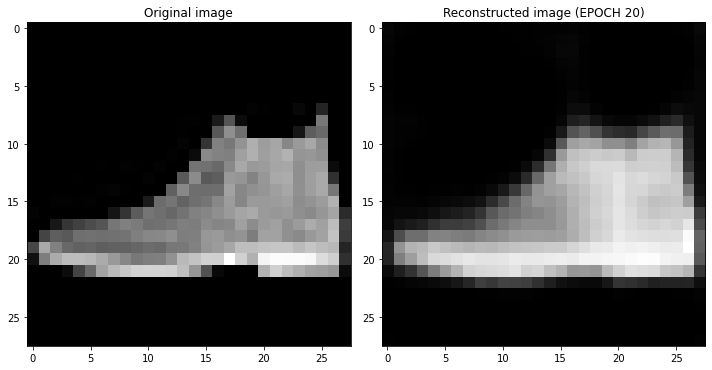



	 TRAINING - FOLD 4/5 - loss: 0.018 
	 VALIDATION   - FOLD 4/5 - loss: 0.013


--------------------------------
FOLD 5
--------------------------------
EPOCH 1/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/20 - loss: 0.023579


EPOCH 2/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/20 - loss: 0.019784


EPOCH 3/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/20 - loss: 0.018643


EPOCH 4/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/20 - loss: 0.016983


EPOCH 5/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/20 - loss: 0.016538


EPOCH 6/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 6/20 - loss: 0.015414


EPOCH 7/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 7/20 - loss: 0.015343


EPOCH 8/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 8/20 - loss: 0.014638


EPOCH 9/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 9/20 - loss: 0.014544


EPOCH 10/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 10/20 - loss: 0.013949


EPOCH 11/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 11/20 - loss: 0.014209


EPOCH 12/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 12/20 - loss: 0.013783


EPOCH 13/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 13/20 - loss: 0.014289


EPOCH 14/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 14/20 - loss: 0.013433


EPOCH 15/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 15/20 - loss: 0.013080


EPOCH 16/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 16/20 - loss: 0.013447


EPOCH 17/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 17/20 - loss: 0.013301


EPOCH 18/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 18/20 - loss: 0.012649


EPOCH 19/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 19/20 - loss: 0.012610


EPOCH 20/20


  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 20/20 - loss: 0.012804




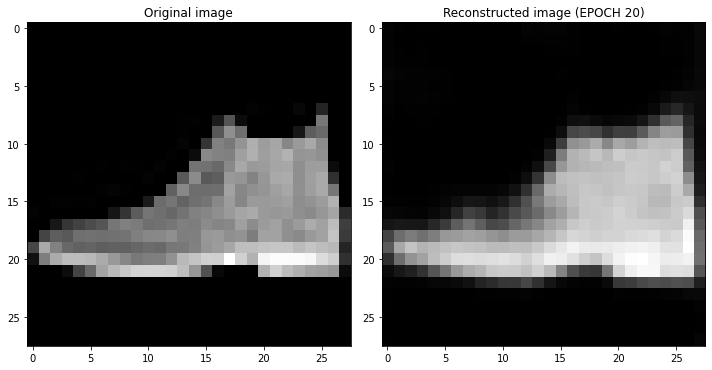



	 TRAINING - FOLD 5/5 - loss: 0.012 
	 VALIDATION   - FOLD 5/5 - loss: 0.013


--------------------------------
K-FOLD CROSS VALIDATION RESULTS FOR 5 FOLDS
--------------------------------
Fold 0: loss=0.01292830053716898
Fold 1: loss=0.012772717513144016
Fold 2: loss=0.012752851471304893
Fold 3: loss=0.012568836100399494
Fold 4: loss=0.012803588062524796
Average Validation Loss: 0.012765258550643921


In [ ]:
k_folds = 5
n_best = 0
best_loss = 100
val_results = {}
kfold = KFold(n_splits=k_folds, shuffle=True)
    
# Start print
print('--------------------------------')

# K-fold Cross Validation model evaluation
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_dataset)):
    
    # Print
    print(f'FOLD {fold+1}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define the dataloaders
    num_workers = 4 # 2
    batch_size = trial.params['batch_size']

    train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, sampler=test_subsampler)
    test_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=len(test_subsampler), sampler=test_subsampler)

    ###########################################################################################################

    torch.manual_seed(seed)

    ### Initialize the two networks
    encoder = Encoder(chs=(1,8,16,32, trial.params['latent_space_dim']), p=trial.params['p'])
    decoder = Decoder(chs=(trial.params['latent_space_dim'], 32, 16, 8, 1), p=trial.params['p'])

    ### Define the loss function
    loss_fn = torch.nn.MSELoss()

    ### Define an optimizer (both for the encoder and the decoder!)
    lr = trial.params['lr'] # Learning rate
    params_to_optimize = [
        {'params': encoder.parameters()},
        {'params': decoder.parameters()}
    ]
    opt = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=trial.params['weight_decay'])

    # Check if the GPU is available
    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    #print(f'Selected device: {device}')

    # Move both the encoder and the decoder to the selected device
    encoder.to(device)
    decoder.to(device)

    ###########################################################################################################

    ### Training loop
    num_epochs = 20 # try 50

    history = {'train_loss' : [],
              'val_loss' : []}

    for epoch in range(num_epochs):
      print('EPOCH %d/%d' % (epoch + 1, num_epochs))
      ### Training (use the training function)
      train_loss = train_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=train_dataloader, 
          loss_fn=loss_fn, 
          optimizer=opt)
      ### Validation  (use the testing function)
      val_loss = test_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=val_dataloader, 
          loss_fn=loss_fn)
      # Print Validationloss
      print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

      if epoch == num_epochs-1 :
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        encoder.eval()
        decoder.eval()
        with torch.no_grad():
            rec_img  = decoder(encoder(img))
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 2, figsize=(10,5))
        axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        # Save figures
        #os.makedirs('autoencoder_progress_%d_features' % latent_space_dim, exist_ok=True)
        #fig.savefig('autoencoder_progress_%d_features/epoch_%d.jpg' % (latent_space_dim, epoch + 1))
        plt.show()
        plt.close()

      # save accuracy and loss for train and validation
      history['train_loss'].append(train_loss)
      history['val_loss'].append(val_loss)


    # Saving the model
    save_path = f'./encoder-fold-{fold}.pth'
    torch.save(encoder.state_dict(), save_path)
    save_path = f'./decoder-fold-{fold}.pth'
    torch.save(decoder.state_dict(), save_path)

    # Print loss
    print('\n\n\t TRAINING - FOLD %d/%d - loss: %0.3f ' % (fold+1, k_folds, history['train_loss'][-1]))
    print('\t VALIDATION   - FOLD %d/%d - loss: %0.3f\n\n' % (fold+1, k_folds, history['val_loss'][-1]))
    print('--------------------------------')
    val_results[fold] = [history['val_loss'][-1]]
    
    if history['val_loss'][-1] < best_loss : n_best = fold
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum_loss = 0.0
for key, value in val_results.items():
  print(f'Fold {key}: loss={value[0]}')
  sum_loss += value[0]
print(f'Average Validation Loss: {sum_loss/len(val_results.items())}')

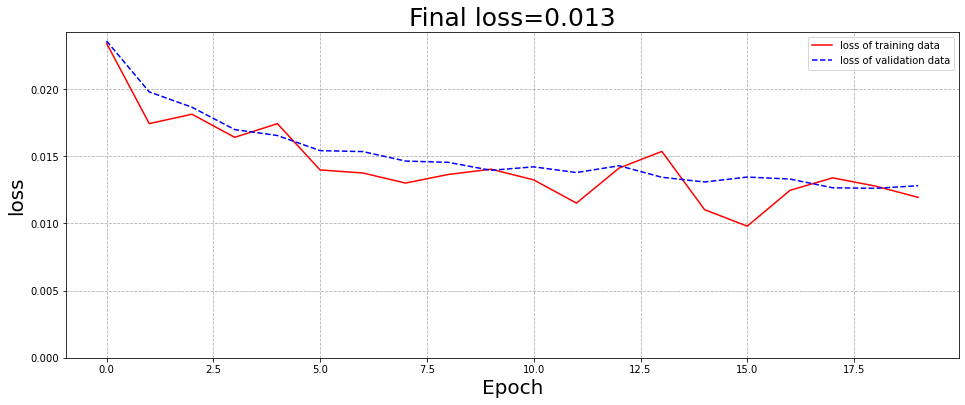

In [ ]:
plt.figure(figsize=(16,6))
obs = 'loss'

plt.plot(history['train_' + obs], 'r', label = obs + ' of training data')
plt.plot(history['val_' + obs], 'b--', label = obs + ' of validation data')
plt.ylabel(obs, fontsize=20)
plt.xlabel('Epoch', fontsize=20)
plt.legend()
plt.ylim(0)
plt.grid(linestyle='--')
plt.title('Final {}={:.3f}' .format(obs, history['val_'+obs][-1]), fontsize=25);

## Interpretability of the model

In [53]:
def display_latent_space(encoder_model):
  encoded_samples = []
  for sample in tqdm(test_dataset):
      img = sample[0].unsqueeze(0).to(device)
      label = sample[1]
      # Encode image
      encoder_model.eval()
      with torch.no_grad():
          encoded_img  = encoder_model(img)
      # Append to list
      encoded_img = encoded_img.flatten().cpu().numpy()
      encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
      encoded_sample['label'] = label
      encoded_samples.append(encoded_sample)

  # Convert to a dataframe
  encoded_samples = pd.DataFrame(encoded_samples)

  return encoded_samples

In [ ]:
# Load saved parameters of one fold

fold_n = n_best
### load best fols encoder
encoder_load_path = f'./encoder-fold-{fold_n}.pth'
encoder.load_state_dict(torch.load(encoder_load_path))

fold_n = n_best
### load best fold decoder
decoder_load_path = f'./decoder-fold-{fold_n}.pth'
decoder.load_state_dict(torch.load(decoder_load_path))

<All keys matched successfully>

In [ ]:
encoded_samples = display_latent_space(encoder)

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

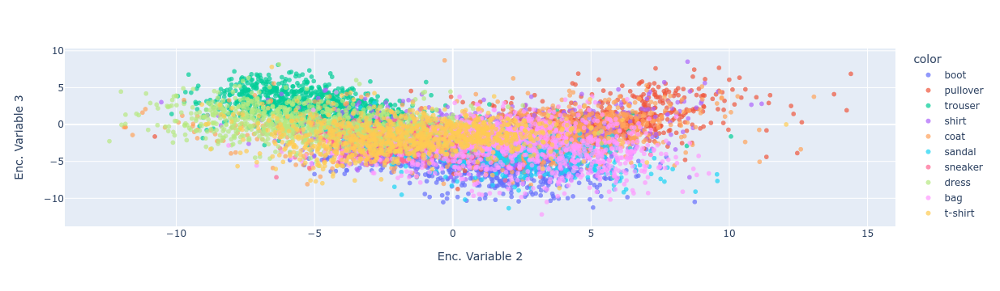

In [ ]:
### Get the encoded representation of the test samples: the plotted dimensions can be chosen between [0; latent space dim)

px.scatter(encoded_samples, x='Enc. Variable 2', y='Enc. Variable 3', color=[label_names[l] for l in encoded_samples.label.to_numpy()], opacity=0.7)

### Space visualization
We can visualize the space using the PCA technique or the TSNE

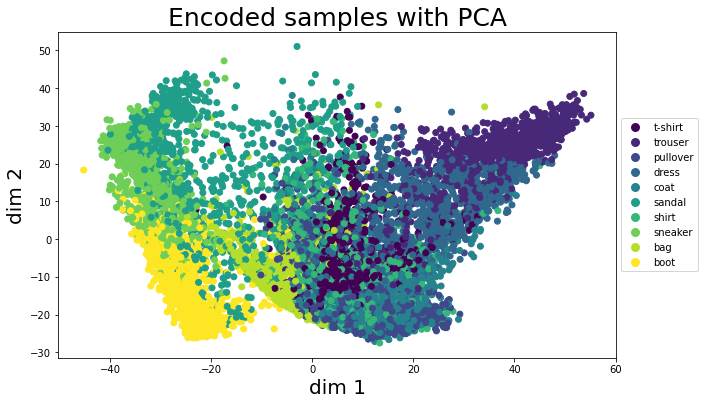

In [ ]:
pca = PCA(n_components=2, random_state=seed)
encoded_samples_reduced_PCA = pca.fit_transform(encoded_samples)

plt.figure(figsize=(10,6))
sc = plt.scatter(encoded_samples_reduced_PCA[:,0], encoded_samples_reduced_PCA[:,1], c=encoded_samples.label.to_numpy())
plt.xlabel('dim 1', fontsize=20)
plt.ylabel('dim 2', fontsize=20)
lp = lambda i: plt.plot([],color=sc.cmap(sc.norm(i)), ms=np.sqrt(81), mec="none",
                        label=label_names[i], ls="", marker="o")[0]
handles = [lp(i) for i in np.unique(encoded_samples["label"])]
plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5))

plt.title('Encoded samples with PCA', fontsize=25);

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



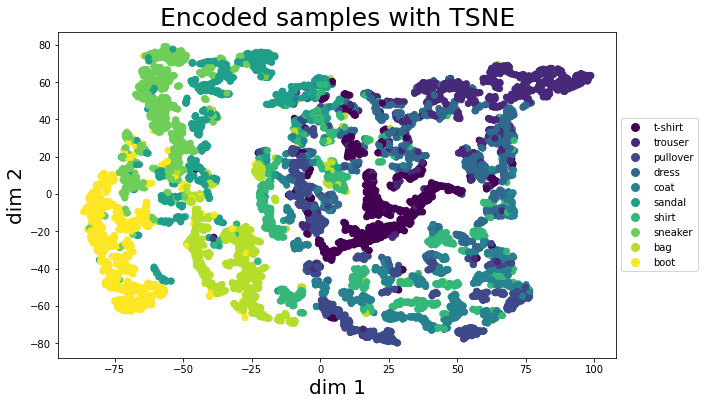

In [ ]:
tsne = TSNE(n_components=2, init='pca', random_state=seed)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples)

plt.figure(figsize=(10,6))
sc = plt.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=encoded_samples.label.to_numpy())
plt.xlabel('dim 1', fontsize=20)
plt.ylabel('dim 2', fontsize=20)
lp = lambda i: plt.plot([],color=sc.cmap(sc.norm(i)), ms=np.sqrt(81), mec="none",
                        label=label_names[i], ls="", marker="o")[0]
handles = [lp(i) for i in np.unique(encoded_samples["label"])]
plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Encoded samples with TSNE', fontsize=25);

### Filters

In [ ]:
### Plot the weights (this is a utility function, no need to analyze this code)
def plot_nchw_data(data, h_num, v_num, title, size=(8,8)):
    fig, axs = plt.subplots(h_num, v_num, figsize=size)
    shape = data.shape
    data = data.reshape(shape[0]*shape[1], shape[2], shape[3])
    for idx, ax in enumerate(axs.flatten()):
        ax.set_xticks([])
        ax.set_yticks([])
        if idx < len(data):
            ax.imshow(data[idx,:,:], cmap='gray')
    plt.suptitle(title, fontsize=15)
    plt.tight_layout(rect=[0, 0, 1, 0.97], h_pad=0, w_pad=0)
    plt.show()

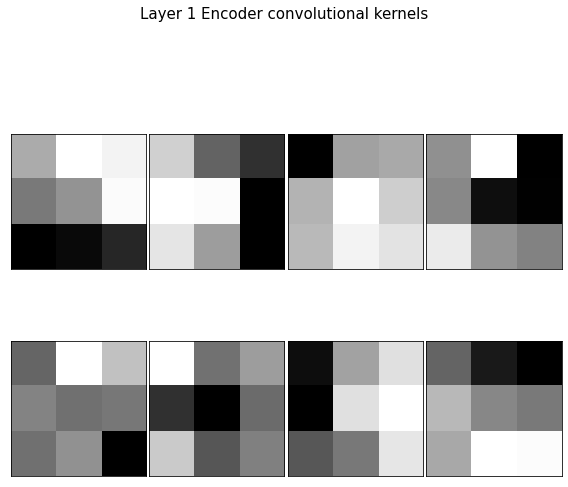

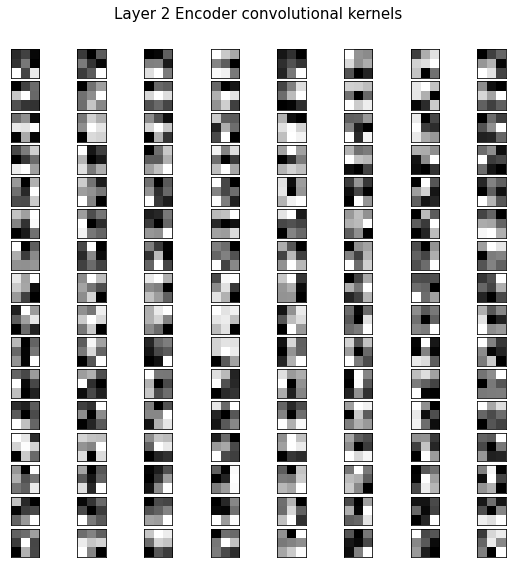

In [ ]:
#print(encoder)

# access model weights of convolutional layers and plot them

weights_l1 = encoder.encoder_cnn[0].weight.data.cpu().numpy()
plot_nchw_data(weights_l1, 2, 4, 'Layer 1 Encoder convolutional kernels')

weights_l2 = encoder.encoder_cnn[4].weight.data.cpu().numpy()
plot_nchw_data(weights_l2, 16, 8, 'Layer 2 Encoder convolutional kernels')

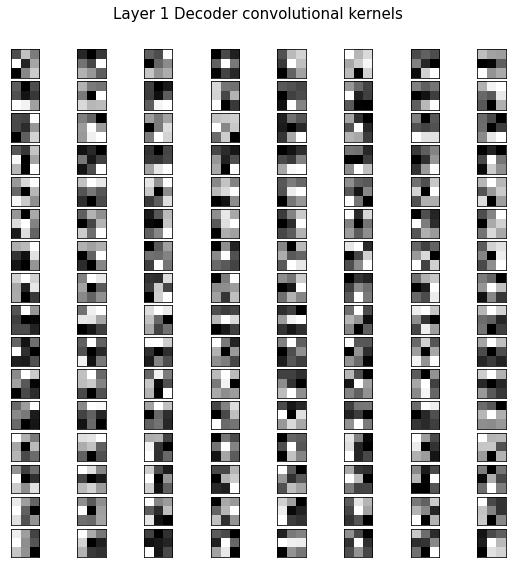

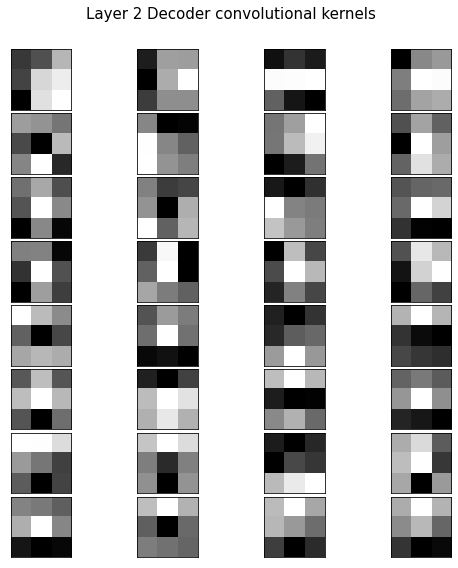

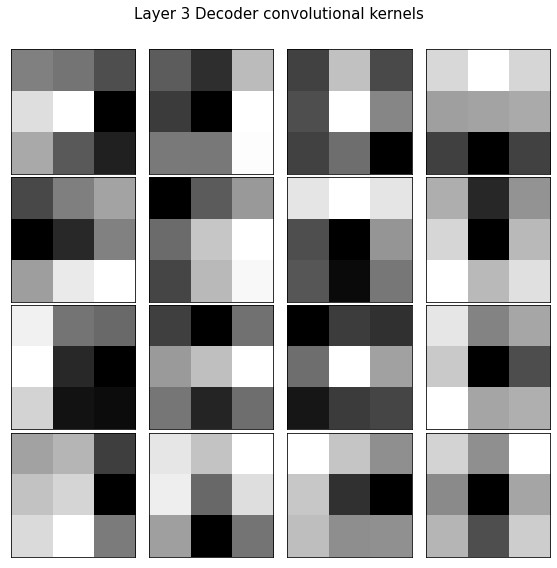

In [ ]:
#print(decoder)

# access model weights of convolutional layers and plot them

weights_l1 = decoder.decoder_conv[0].weight.data.cpu().numpy()
plot_nchw_data(weights_l1, 16, 8, 'Layer 1 Decoder convolutional kernels')

weights_l2 = decoder.decoder_conv[2].weight.data.cpu().numpy()
plot_nchw_data(weights_l2, 8, 4, 'Layer 2 Decoder convolutional kernels')

weights_l3 = decoder.decoder_conv[4].weight.data.cpu().numpy()
plot_nchw_data(weights_l3, 4, 4, 'Layer 3 Decoder convolutional kernels')

### Activation

In [ ]:
# Hook function to call during forward pass
def hook_fn(module, input, output):
    intermediate_outputs.append(output)

# Attach hook function to all the convolutional layers
hook_handles = [] 
### encoder layers
hook_handles.append(encoder.encoder_cnn[0].register_forward_hook(hook_fn))
hook_handles.append(encoder.encoder_cnn[4].register_forward_hook(hook_fn))
### decoder layers
hook_handles.append(decoder.decoder_conv[0].register_forward_hook(hook_fn))
hook_handles.append(decoder.decoder_conv[2].register_forward_hook(hook_fn))

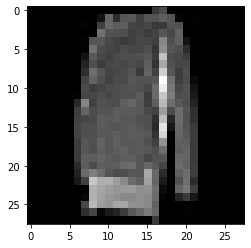

In [ ]:
# Define input: image of test set
net_input = test_dataset[66][0].unsqueeze(0)
plt.imshow(net_input.reshape(28,28), cmap='gist_gray')
net_input = net_input.to(device)

In [ ]:
# Evaluate output
encoder.eval()
decoder.eval()
with torch.no_grad():
    intermediate_outputs = []
    out = encoder(net_input)
    out = decoder(out)

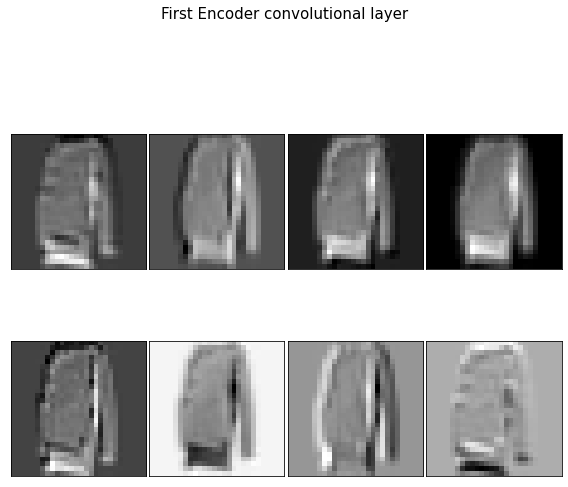

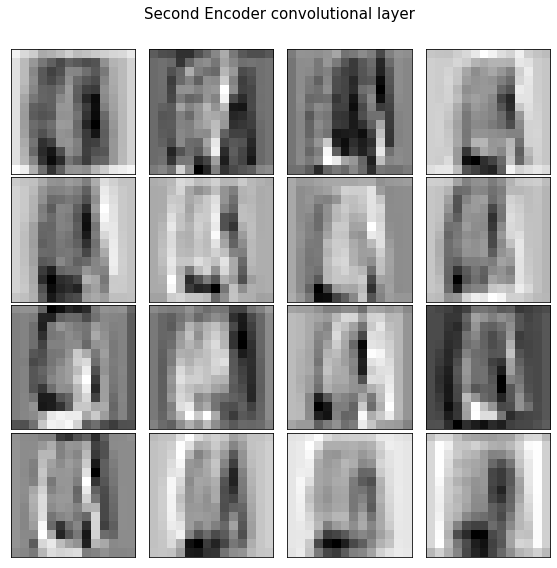

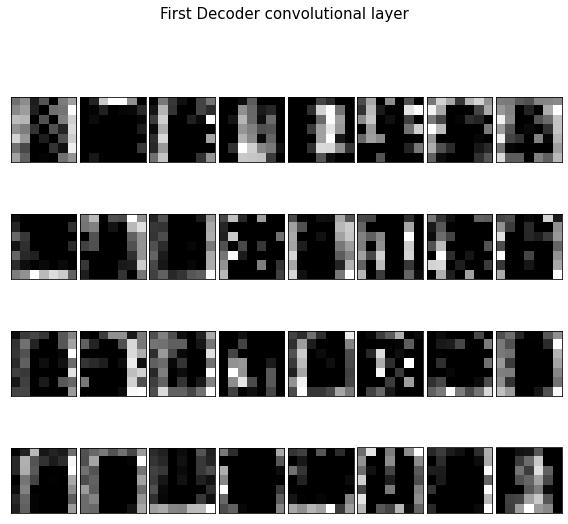

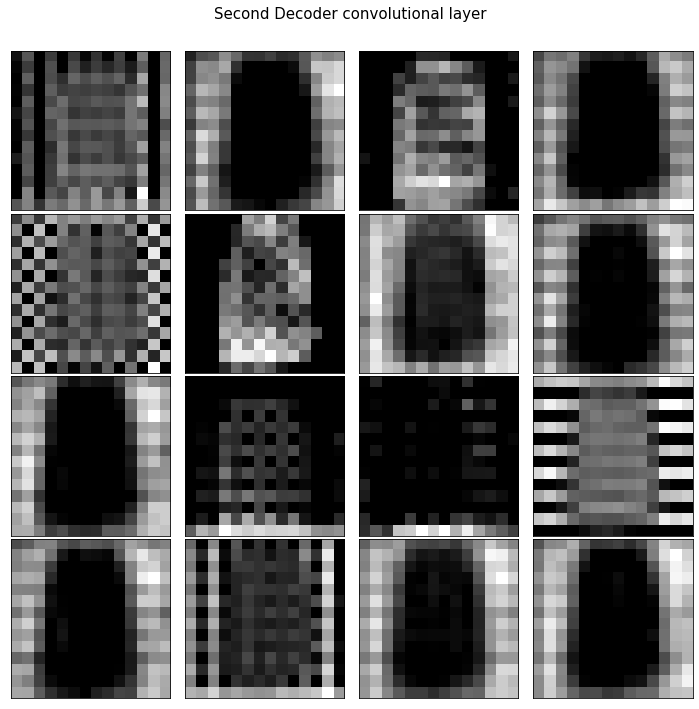

In [ ]:
# Analyze intermediate encoder outputs
intermediate_output = intermediate_outputs[0].cpu().data.numpy()
plot_nchw_data(intermediate_output, 2, 4, 'First Encoder convolutional layer')

intermediate_output = intermediate_outputs[1].cpu().data.numpy()
plot_nchw_data(intermediate_output, 4, 4, 'Second Encoder convolutional layer')

# Analyze intermediate decoder outputs
intermediate_output = intermediate_outputs[2].cpu().data.numpy()
plot_nchw_data(intermediate_output, 4, 8, 'First Decoder convolutional layer')

intermediate_output = intermediate_outputs[3].cpu().data.numpy()
plot_nchw_data(intermediate_output, 4, 4, 'Second Decoder convolutional layer', size=(10,10))

# $\beta$-VAE

In [49]:
MU = state_key('mu')
LOGVAR = state_key('logvar')

### Define the dataloaders
batch_size = 300
num_workers = 4 #2

train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_dataloader  = DataLoader(val, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



In [37]:
class VAE(nn.Module):
    def __init__(self, latent_size):
      
        super(VAE, self).__init__()
        self.latent_size = latent_size

        ### Encoder architecture
        self.encoder = nn.Sequential(
            #first conv block
            nn.Conv2d(1, 16, 3, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(num_features=16),
            nn.MaxPool2d((2,2), stride=2),
            # second conv block
            nn.Conv2d(16, 32, 3, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(num_features=32),
            nn.MaxPool2d((2,2)),
        )
        
        ### Latent space
        self.mu = nn.Linear(32 * 7 * 7, latent_size)
        self.logvar = nn.Linear(32 * 7 * 7, latent_size)
        
        ### Decoder architecture
        self.upsample = nn.Linear(latent_size, 32 * 7 * 7)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid(),
        )

    ### Reparametrization to allow backpropagation
    def reparameterize(self, mu, logvar):
        if self.training:
            std = torch.exp(0.5*logvar)
            eps = torch.randn_like(std)
            return eps.mul(std).add_(mu)
        else:
            return mu
    
    def encode_image(self, x):
        image = x
        x = self.encoder(x).view(x.size(0), -1)
        
        mu = self.mu(x)
        logvar = self.logvar(x)
        return mu, logvar

    def decode_image(self, x):
        result = self.decoder(self.upsample(x).view(-1, 32, 7, 7))
        return result

    def forward(self, x, state):
        image = x
        mu, logvar = self.encode_image(x)

        sample = self.reparameterize(mu, logvar)
        
        result = self.decode_image(sample)
        
        if state is not None:
            state[torchbearer.Y_TRUE] = image
            state[MU] = mu
            state[LOGVAR] = logvar
        
        return result

def beta_kl(mu_key, logvar_key, beta=5):
    @callbacks.add_to_loss
    def callback(state):
        mu = state[mu_key]
        logvar = state[logvar_key]
        return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) * beta
    return callback

def plot_progress(key=torchbearer.Y_PRED, num_images=100, nrow=10):
    @callbacks.on_step_validation
    @callbacks.once_per_epoch
    def callback(state):
        images = state[key]
        image = make_grid(images[:num_images], nrow=nrow, normalize=True)[0, :, :]
        plt.figure(figsize=(16,8))
        plt.imshow(image.detach().cpu().numpy(), cmap="gray")
        plt.show()
    
    return callback

for the best beta https://arxiv.org/pdf/2006.13202.pdf

In [ ]:
### Definition of parameters
vae_LSdim = 18
beta = 0.01

vae_model = VAE(latent_size=vae_LSdim) 

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

### optimizer
optimizer = optim.Adam(filter(lambda p: p.requires_grad, vae_model.parameters()), lr=5e-4, weight_decay=5e-4)

### Definition of training procedure using Trial
trial = Trial(vae_model, optimizer, nn.MSELoss(reduction='sum'), metrics=['acc', 'loss'], callbacks=[
    beta_kl(MU, LOGVAR, beta),
    callbacks.ConsolePrinter(),
    plot_progress()
], verbose=1).with_generators(train_generator=train_dataloader, test_generator=val_dataloader)

Selected device: cuda


### Train the model

  0%|          | 0/20 [00:00<?, ?it/s]

/opt/conda/lib/python3.7/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /opt/conda/conda-bld/pytorch_1623448265233/work/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


0/20(t): loss=10246.6006, mse=0.0424, running_loss=6843.6831, running_mse=0.0279
1/20(t): loss=5708.9814, mse=0.0232, running_loss=5428.4409, running_mse=0.022
2/20(t): loss=5042.8003, mse=0.0204, running_loss=4864.4688, running_mse=0.0196
3/20(t): loss=4652.3833, mse=0.0187, running_loss=4555.4033, running_mse=0.0183
4/20(t): loss=4435.355, mse=0.0178, running_loss=4386.1548, running_mse=0.0176
5/20(t): loss=4273.6499, mse=0.0172, running_loss=4214.7925, running_mse=0.0169
6/20(t): loss=4134.3374, mse=0.0166, running_loss=4104.8345, running_mse=0.0165
7/20(t): loss=4048.0046, mse=0.0162, running_loss=4016.4409, running_mse=0.0161
8/20(t): loss=3942.3398, mse=0.0158, running_loss=3928.9419, running_mse=0.0157
9/20(t): loss=3903.1719, mse=0.0156, running_loss=3939.7625, running_mse=0.0158
10/20(t): loss=3829.8716, mse=0.0153, running_loss=3772.8701, running_mse=0.0151
11/20(t): loss=3765.4836, mse=0.0151, running_loss=3760.6653, running_mse=0.015
12/20(t): loss=3709.6763, mse=0.0148, ru

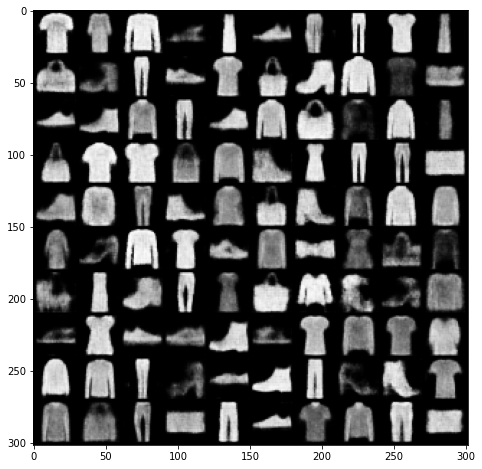

0/1(v): test_loss=3487.6619, test_mse=0.0139


In [ ]:
trial.to(device)
history = trial.run(20)
trial.evaluate(verbose=0, data_key=torchbearer.TEST_DATA)

save_path = f'./beta_vae_params.pth'
torch.save(vae_model.state_dict(), save_path)

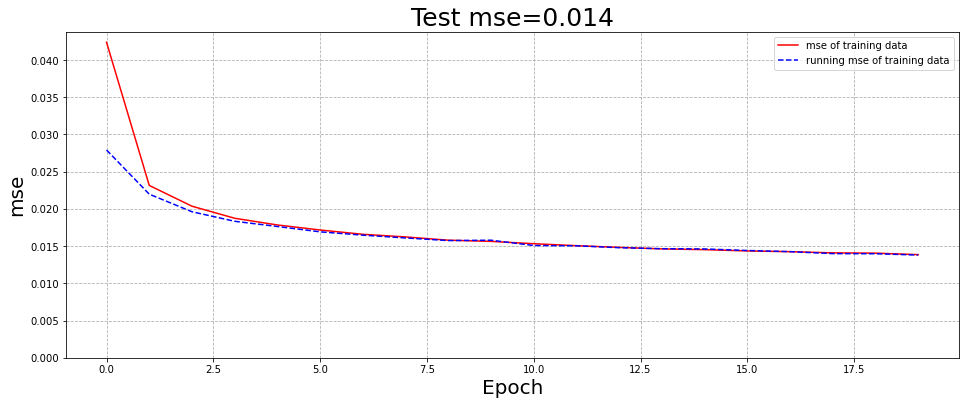

In [ ]:
plt.figure(figsize=(16,6))
obs = 'mse'

plt.plot([history[i][obs] for i in range(len(history))], 'r', label = obs + ' of training data')
plt.plot([history[i]['running_'+obs] for i in range(len(history))], 'b--', label = 'running ' + obs + ' of training data')
plt.ylabel(obs, fontsize=20)
plt.xlabel('Epoch', fontsize=20)
plt.legend()
plt.ylim(0)
plt.grid(linestyle='--')
plt.title('Test {}={:.3f}' .format(obs, history[-1]['test_'+obs]), fontsize=25);

## Explore latent space

In [55]:
def display_latent_space_VAE(model):
  encoded_samples = []
  for sample in tqdm(test_dataset):
      img = sample[0].unsqueeze(0).to(device)
      label = sample[1]
     
      encoded_img = model.encode_image(img)
      # Append to list
      encoded_img = encoded_img[0].flatten().detach().cpu().numpy()
      encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
      encoded_sample['label'] = label
      encoded_samples.append(encoded_sample)

  # Convert to a dataframe
  encoded_samples = pd.DataFrame(encoded_samples)

  return encoded_samples

def explore_space(data, dim, steps, no_images=9):
  encoded_image = vae_model.encode_image(data.to(device).unsqueeze(0))
  noise = torch.zeros(vae_LSdim).to(device)

  x = vae_model.reparameterize(encoded_image[0], encoded_image[1])
  samples = [vae_model.decode_image(x)]
  for a in range(no_images):
    for l in range(len(dim)):
        d = dim[l]
        noise[[d]] = noise[[d]] +  steps[l]
    x = vae_model.reparameterize(encoded_image[0] + noise, encoded_image[1])
    samples.append(vae_model.decode_image(x).cpu())

  fig, ax = plt.subplots(1, len(samples), figsize=(24,4))
  ax[0].imshow(data.squeeze(), cmap='gray')
  ax[0].set_title('Original image', fontsize=15)
  ax[1].imshow(samples[0].squeeze().cpu().detach().numpy(), cmap='gray')
  ax[1].set_title('Reconstructed', fontsize=15)
  for i in range(1, len(samples)-1, 1):
    ax[i+1].imshow(samples[i].squeeze().cpu().detach().numpy(), cmap='gray')
    ax[i+1].set_title('Noise:' + str(steps*i), fontsize=15)

  fig.suptitle('Exploring Latent space dimension: ' + str(dim), fontsize=20)
  plt.show()

In [ ]:
encoded_samples_vae = display_latent_space_VAE(vae_model)

  0%|          | 0/10000 [00:00<?, ?it/s]

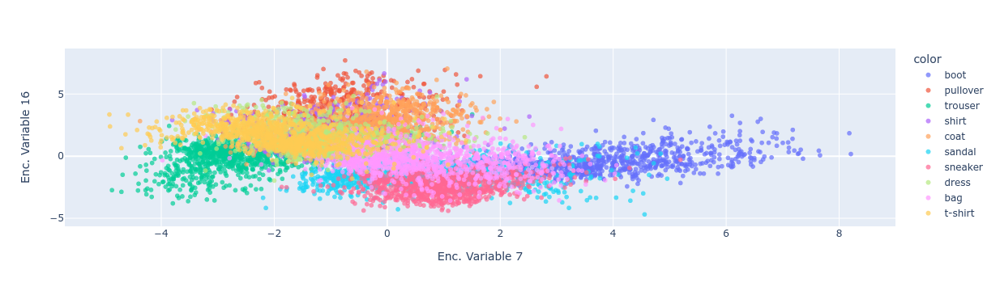

In [ ]:
### Get the encoded representation of the test samples: the plotted dimensions can be chosen between [0; latent space dim)

px.scatter(encoded_samples_vae, x='Enc. Variable 7', y='Enc. Variable 16', color=[label_names[l] for l in encoded_samples.label.to_numpy()], opacity=0.7)

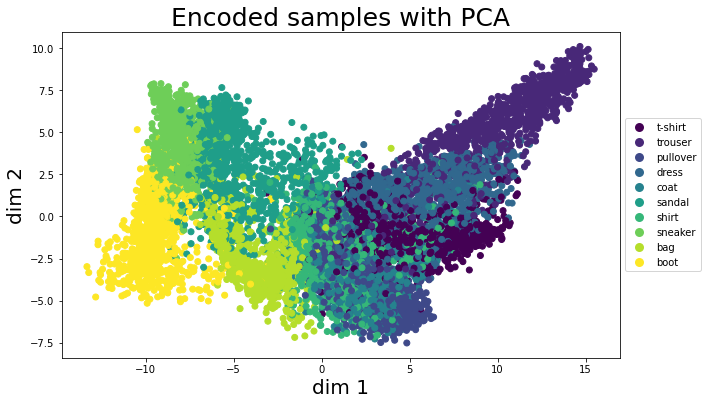

In [ ]:
pca = PCA(n_components=2, random_state=seed)
encoded_samples_reduced_PCA = pca.fit_transform(encoded_samples_vae)

plt.figure(figsize=(10,6))
sc = plt.scatter(encoded_samples_reduced_PCA[:,0], encoded_samples_reduced_PCA[:,1], c=encoded_samples_vae.label.to_numpy())
plt.xlabel('dim 1', fontsize=20)
plt.ylabel('dim 2', fontsize=20)
lp = lambda i: plt.plot([],color=sc.cmap(sc.norm(i)), ms=np.sqrt(81), mec="none",
                        label=label_names[i], ls="", marker="o")[0]
handles = [lp(i) for i in np.unique(encoded_samples_vae["label"])]
plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Encoded samples with PCA', fontsize=25);

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/opt/conda/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



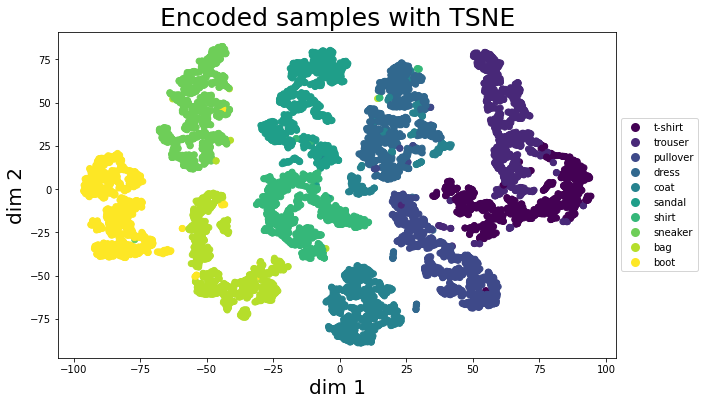

In [ ]:
tsne = TSNE(n_components=2, init='pca', random_state=seed)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples_vae)

plt.figure(figsize=(10,6))
sc = plt.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=encoded_samples_vae.label.to_numpy())
plt.xlabel('dim 1', fontsize=20)
plt.ylabel('dim 2', fontsize=20)
lp = lambda i: plt.plot([],color=sc.cmap(sc.norm(i)), ms=np.sqrt(81), mec="none",
                        label=label_names[i], ls="", marker="o")[0]
handles = [lp(i) for i in np.unique(encoded_samples_vae["label"])]
plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Encoded samples with TSNE', fontsize=25);

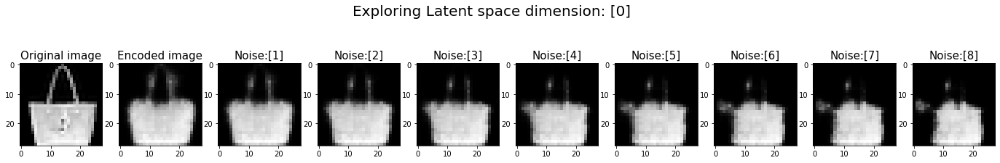

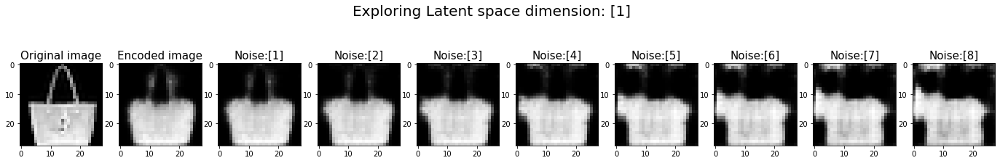

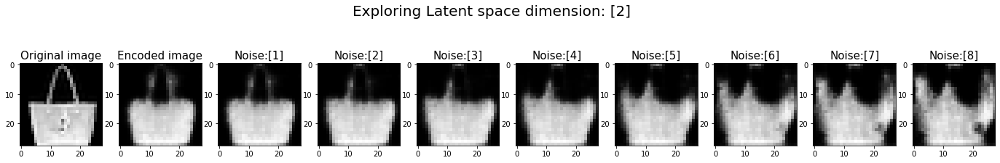

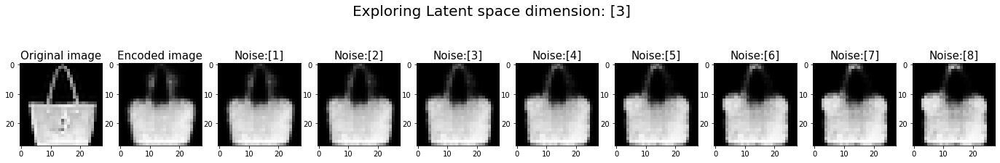

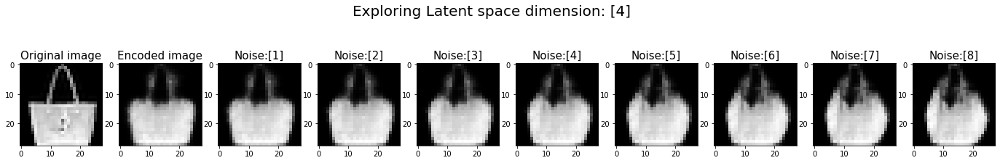

...

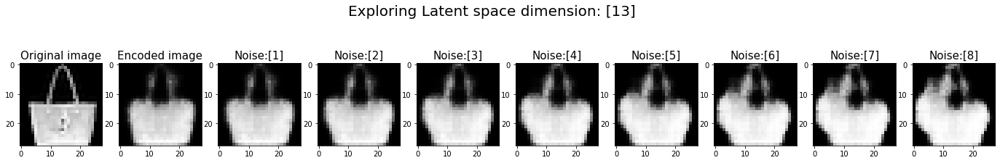

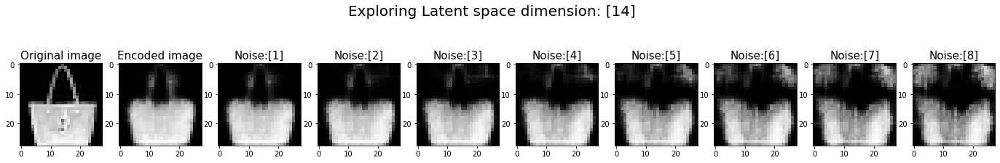

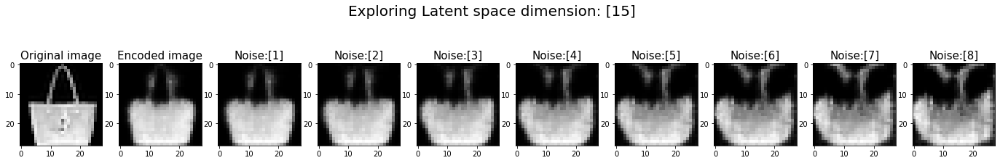

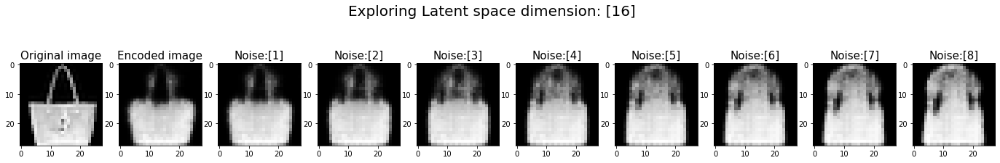

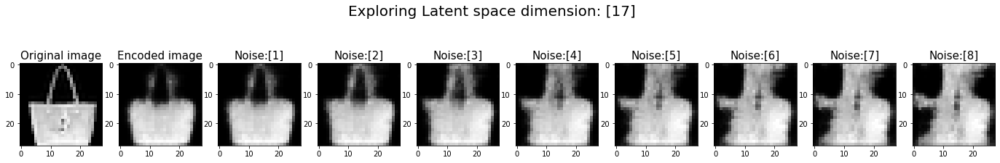

In [ ]:
random.seed(55) # change seed to change image

data, label = random.choice(train_dataset)

dim = [1] # dimension to explore of latent space
step = np.array([1]) # step size in a specific dim of the latent space

for d in range(vae_LSdim):
    explore_space(data, [d], step, 9)

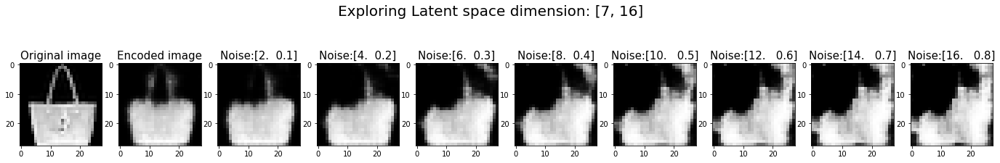

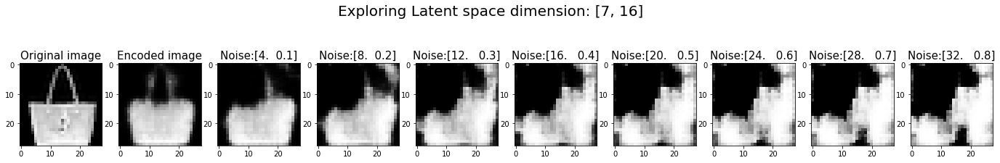

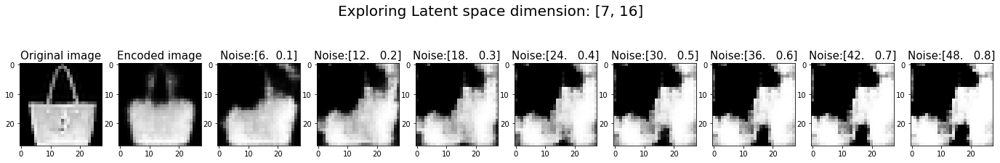

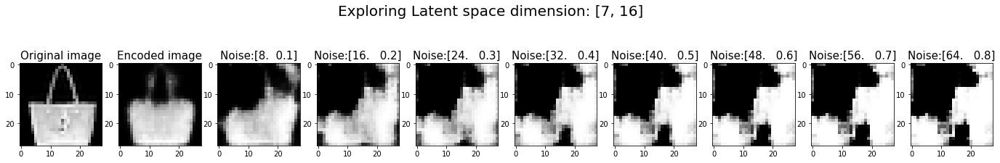

In [ ]:
### change the size of the steps in a specific dim
d = [7,16]

for i in range(1,5,1):
    step = np.array([i*2, 0.1])
    explore_space(data, d, step, 9)

In [ ]:
SAMPLES = state_key('samples')
dims = [i for i in range(vae_model.latent_size)]

In [ ]:
def draw_space(self, x, state=None):
    image = x
    x = self.encoder(x).relu().view(x.size(0), -1)
    sample = self.mu(x)

    samples = sample.unsqueeze(1).repeat(1, 10, 1)
    space = torch.linspace(-3, 3, steps=10, device=x.device)
    
    for dim in dims:
        samples[dim, :, dim] = space

    sample = samples.view(-1, samples.size(2))
    
    result = self.decoder(self.upsample(sample).relu().view(-1, 64, 7, 7))
        
    if state is not None:
        state[SAMPLES] = result
    return None

  0%|          | 0/1 [00:00<?, ?it/s]

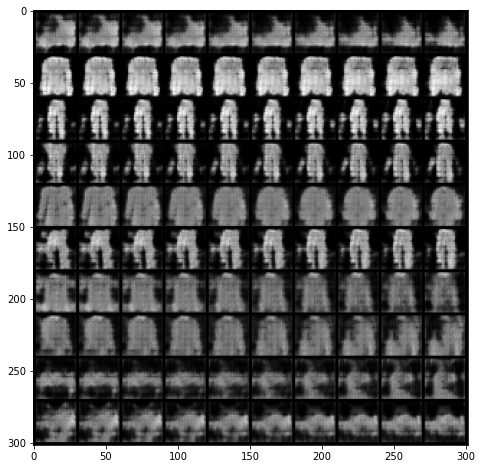

In [ ]:
vae_model.forward = types.MethodType(draw_space, vae_model)  

trial = Trial(vae_model, callbacks=[
    plot_progress(SAMPLES, num_images=100, nrow=10)
], verbose=1).with_generators(test_generator=test_dataloader)

trial.to(device)
_ = trial.for_test_steps(1).evaluate(data_key=torchbearer.TEST_DATA)

# GAN

In [100]:
### Define the dataloaders
batch_size = 512
num_workers = 2

train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_dataloader  = DataLoader(val, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

In [134]:
# Number of channels: 1 for grayscale
nc = 1

# Size of z latent vector (i.e. size of generator input)
gan_LSdim = 32

# Size of feature maps
ngf = 64
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02.

In [135]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Discriminator

In [136]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.main = nn.Sequential(
            # conv block 1
            nn.Conv2d(nc, ndf, kernel_size=3, stride=2),
            nn.ReLU(True),
            # conv block 2
            nn.Conv2d(ndf, ndf*2, kernel_size=3, stride=2),
            nn.ReLU(True),
            # linear part
            nn.Flatten(start_dim=1),
            nn.Linear(ndf*2*6*6, 1),
        )

    def forward(self, x):
        return self.main(x)

# Create the Discriminator
netD = Discriminator().to(device)

# Apply the weights_init function 
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
    (3): ReLU(inplace=True)
    (4): Flatten(start_dim=1, end_dim=-1)
    (5): Linear(in_features=4608, out_features=1, bias=True)
  )
)


### Generator

In [137]:
# Generator Code

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        self.lin = nn.Sequential(
            # linear part
            nn.Linear(gan_LSdim, 64*6*6),
            nn.ReLU(True),
        )
        
        self.main = nn.Sequential(
            # deconv block 1
            nn.ConvTranspose2d(64, ngf*2, kernel_size=3, stride=2, padding=0),
            nn.ReLU(True),
            # deconv block 2
            nn.ConvTranspose2d(ngf*2, ngf, kernel_size=3, stride=2, padding=0),
            nn.ReLU(True),
            # deconv block 3
            nn.ConvTranspose2d(ngf, nc, kernel_size=3, stride=1, padding=0),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.lin(x).view(-1, 64, 6, 6)
        return self.main(x)

# Create the generator
netG = Generator().to(device)

# Apply the weights_init function 
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (lin): Sequential(
    (0): Linear(in_features=32, out_features=2304, bias=True)
    (1): ReLU(inplace=True)
  )
  (main): Sequential(
    (0): ConvTranspose2d(64, 128, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(64, 1, kernel_size=(3, 3), stride=(1, 1))
    (5): Sigmoid()
  )
)


### Model and function definition

In [138]:
# Initialize BCELoss function (sigmoid+BCELoss)
criterion = nn.BCEWithLogitsLoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, 1, 1, gan_LSdim, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

### Training loop

In [139]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(train_dataloader, 0):

        ############################
        # TRAINING THE DISCRIMINATOR
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, 1, 1, gan_LSdim, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # TRAINING THE GENERATOR
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch+1, num_epochs, i, len(train_dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

save_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/gan_generator_params.pth'
torch.save(netG.state_dict(), save_path)
save_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/gan_discriminator_params.pth'
torch.save(netD.state_dict(), save_path)

Starting Training Loop...
[1/100][0/94]	Loss_D: 1.3863	Loss_G: 0.7027	D(x): -0.0502	D(G(z)): -0.0514 / -0.0190
[1/100][50/94]	Loss_D: 1.0267	Loss_G: 1.0445	D(x): 0.7015	D(G(z)): -0.3955 / -0.6081
[2/100][0/94]	Loss_D: 1.0289	Loss_G: 1.0135	D(x): 0.5568	D(G(z)): -0.3746 / -0.5608
[2/100][50/94]	Loss_D: 1.7856	Loss_G: 0.6963	D(x): -0.4373	D(G(z)): 0.1439 / 0.0050
[3/100][0/94]	Loss_D: 1.2037	Loss_G: 0.7772	D(x): 0.3287	D(G(z)): -0.0841 / -0.1615
[3/100][50/94]	Loss_D: 1.1732	Loss_G: 0.9110	D(x): 0.3286	D(G(z)): -0.2885 / -0.3888
[4/100][0/94]	Loss_D: 1.6550	Loss_G: 0.7119	D(x): -0.3804	D(G(z)): 0.0799 / -0.0329
[4/100][50/94]	Loss_D: 1.2412	Loss_G: 0.7337	D(x): 0.3082	D(G(z)): -0.0298 / -0.0789
[5/100][0/94]	Loss_D: 1.1312	Loss_G: 0.9521	D(x): 0.2659	D(G(z)): -0.3955 / -0.4507
[5/100][50/94]	Loss_D: 1.5983	Loss_G: 0.7528	D(x): -0.3908	D(G(z)): -0.0367 / -0.1122
[6/100][0/94]	Loss_D: 1.2454	Loss_G: 0.6961	D(x): 0.3630	D(G(z)): 0.0340 / -0.0056
[6/100][50/94]	Loss_D: 1.2135	Loss_G: 0.8285	

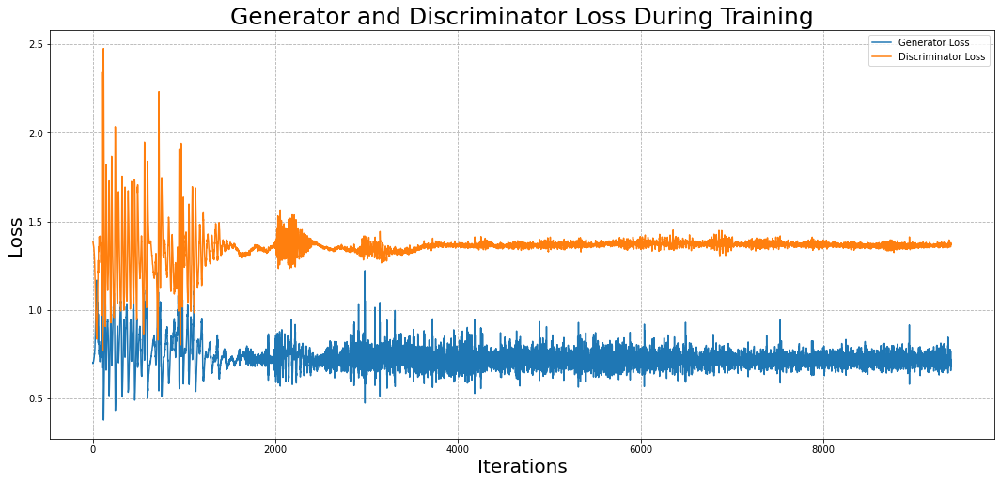

In [140]:
plt.figure(figsize=(18,8))
plt.title("Generator and Discriminator Loss During Training", fontsize=25)
plt.plot(G_losses,label="Generator Loss")
plt.plot(D_losses,label="Discriminator Loss")
plt.xlabel("Iterations", fontsize=20)
plt.ylabel("Loss", fontsize=20)
plt.legend()
plt.grid(linestyle='--')
plt.show()

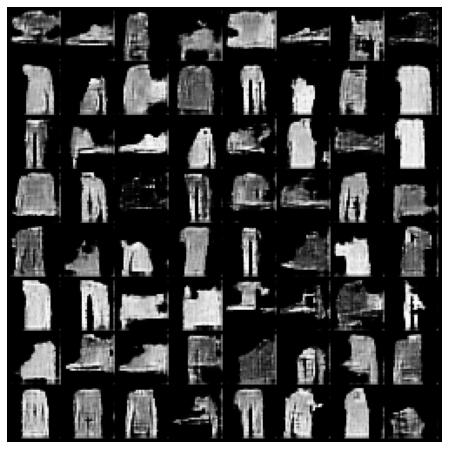

In [141]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

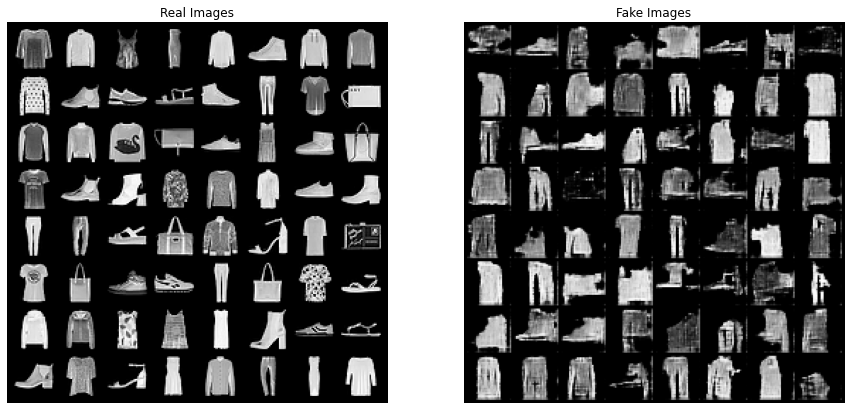

In [142]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# GENERATION OF NEW SAMPLES

Load the three architecture: autoencoder, vae, gan -> generate samples for all the three
 1) load the weights
 2) generate some samples using decoder (defined function)
 3) represent the latent space of the data and compare with standard algorithms (pca and t-sne)

#### Load the weights

In [28]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [78]:
# Load saved parameters

### AUTOENCODER
fold_n = 4
encoder = Encoder(chs=(1,8,16,32,38))
### load best fols encoder
encoder_load_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/params/encoder-fold-{fold_n}.pth' 
#f'./encoder-fold-{fold_n}.pth'
encoder.load_state_dict(torch.load(encoder_load_path))

fold_n = 4
### load best fold decoder
decoder = Decoder(chs=(38, 32, 16, 8, 1))
decoder_load_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/params/decoder-fold-{fold_n}.pth' 
#f'./decoder-fold-{fold_n}.pth'
decoder.load_state_dict(torch.load(decoder_load_path))

### beta-VAE
vae_model = VAE(latent_size=18) 
vae_load_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/params/beta_vae_params.pth' 
#f'./beta_vae_params.pth'
vae_model.load_state_dict(torch.load(vae_load_path))

### GAN
generator_load_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/params/gan_generator_params (1).pth'
netG.load_state_dict(torch.load(generator_load_path))

discriminator_load_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/params/gan_discriminator_params (1).pth'
netD.load_state_dict(torch.load(discriminator_load_path))

<All keys matched successfully>

#### Generate new samples

To generate new samples we have to insert the coordinates equal to the latent space dim, using random number we can create a list of n=2*(latent space dim) elelments

In [89]:
def display_image_sequence(start, end, latent_space_dim, no_of_imgs, decoder_model):

    decoder_model.to(device)
    new_images = []
    for n in range(no_of_imgs):
      #vector = np.random.uniform(start[n], end[n], latent_space_dim)
      #vector = vector[:, np.newaxis]
      #vector = torch.FloatTensor(np.array(vector.reshape(1,latent_space_dim))).to(device)
      vector = torch.randn(1, latent_space_dim, 1, 1, device=device).view(1, latent_space_dim)
      new_image = decoder_model(vector)
      new_images.append(new_image.squeeze().cpu().detach().numpy())
    
    # Display some images
    fig, ax = plt.subplots(ncols=no_of_imgs, sharex=False,
                             sharey=True, figsize=(20, 11))
    
    for i in range(no_of_imgs):
        ax[i].imshow(new_images[i], cmap='gray')
        ax[i].get_xaxis().set_visible(False)
        ax[i].get_yaxis().set_visible(False)
    plt.show()

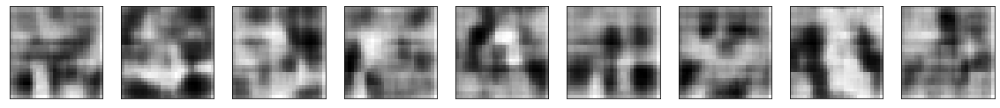

In [90]:
### AUTOENCODER
n_images = 9
display_image_sequence([-i for i in range(n_images)], [i for i in range(n_images)], 38, n_images, decoder_model=decoder)

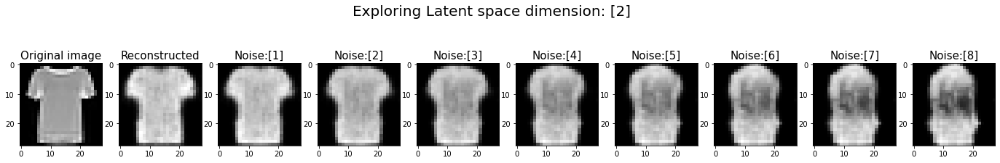

In [ ]:
### beta-VAE

random.seed(102) # change seed to change image
data, label = random.choice(train_dataset)

torch.manual_seed(15)
#data = torch.randn((1,28,28))
#data = torch.normal(mean=0.5, std=1, size=(1,28,28))

dim = np.array([2])
explore_space(data, dim, np.array([1]), 9)

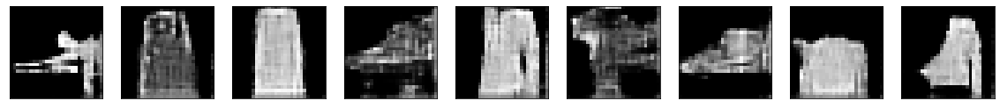

In [146]:
### GAN
n_images = 9
display_image_sequence([-i for i in range(n_images)], [i for i in range(n_images)], gan_LSdim, n_images, decoder_model=netG)

#### Latent space representation

We can here compare the ability of the autoencoder to represent the data as a pca or as a t-sne. So we have to train with latent space dim the same model with latent_dim=2, both autoencoder and vae. Then we plot 4 different representations: autoencoder, vae, pca, t-sne

##### Re-training dim=2: Autoencoder

In [47]:
### train models with dim = 2

### Set the random seed for reproducible results
torch.manual_seed(seed)

latent_space_dim = 2 #18

### Initialize the two networks
encoder = Encoder(chs=(1,8,16,32,latent_space_dim))
decoder = Decoder(chs=(latent_space_dim, 32, 16, 8, 1))

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 5e-4 # Learning rate
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
opt = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-5)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

### Training cycle
num_epochs = 10

for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    _ = train_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=opt)
    ### Validation  (use the testing function)
    val_loss = test_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=val_dataloader, 
        loss_fn=loss_fn)
    # Print Validationloss
    print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

    # Save network parameters
    torch.save(encoder.state_dict(), '/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/encoder2_params.pth')
    torch.save(decoder.state_dict(), '/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/decoder2_params.pth')

Selected device: cuda
EPOCH 1/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 1/10 - loss: 0.061510


EPOCH 2/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 2/10 - loss: 0.050951


EPOCH 3/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 3/10 - loss: 0.046293


EPOCH 4/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 4/10 - loss: 0.043881


EPOCH 5/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 5/10 - loss: 0.041876


EPOCH 6/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 6/10 - loss: 0.040645


EPOCH 7/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 7/10 - loss: 0.040239


EPOCH 8/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 8/10 - loss: 0.039576


EPOCH 9/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 9/10 - loss: 0.039320


EPOCH 10/10


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 VALIDATION - EPOCH 10/10 - loss: 0.038967




##### Re-training dim=2: $\beta-VAE$

In [50]:
### Definition of parameters
vae_LSdim = 2
beta = 0.01

vae_model = VAE(latent_size=vae_LSdim) 

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

### optimizer
optimizer = optim.Adam(filter(lambda p: p.requires_grad, vae_model.parameters()), lr=5e-4, weight_decay=5e-4)

### Definition of training procedure using Trial
trial = Trial(vae_model, optimizer, nn.MSELoss(reduction='sum'), metrics=['acc', 'loss'], callbacks=[
    beta_kl(MU, LOGVAR, beta),
    callbacks.ConsolePrinter()
], verbose=1).with_generators(train_generator=train_dataloader, test_generator=val_dataloader)

trial.to(device)
history = trial.run(20)
trial.evaluate(verbose=0, data_key=torchbearer.TEST_DATA)

save_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/beta_vae2_params.pth'
torch.save(vae_model.state_dict(), save_path)

Selected device: cuda


  0%|          | 0/20 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



0/20(t): loss=25224.123, mse=0.1058, running_loss=18312.6875, running_mse=0.0756
1/20(t): loss=14888.127, mse=0.0609, running_loss=14076.9043, running_mse=0.0576
2/20(t): loss=12972.6797, mse=0.0532, running_loss=12652.2246, running_mse=0.052
3/20(t): loss=11986.3623, mse=0.0494, running_loss=11793.6406, running_mse=0.0487
4/20(t): loss=11316.7295, mse=0.0468, running_loss=11125.3125, running_mse=0.0461
5/20(t): loss=10864.4287, mse=0.0451, running_loss=10695.1064, running_mse=0.0444
6/20(t): loss=10529.1738, mse=0.0438, running_loss=10401.8301, running_mse=0.0433
7/20(t): loss=10314.3408, mse=0.043, running_loss=10267.0195, running_mse=0.0428
8/20(t): loss=10104.4131, mse=0.0421, running_loss=10094.4648, running_mse=0.0421
9/20(t): loss=10000.376, mse=0.0417, running_loss=9993.416, running_mse=0.0417
10/20(t): loss=9867.3154, mse=0.0412, running_loss=9900.1533, running_mse=0.0414
11/20(t): loss=9752.4521, mse=0.0408, running_loss=9710.3105, running_mse=0.0406
12/20(t): loss=9681.8096,

##### Visualization

In [51]:
test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=num_workers)
data, labels = next(iter(test_dataloader))
data = data.reshape(10000,28*28)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



In [54]:
### Get the encoded representation of the test samples

encoded_samples = display_latent_space(encoder) ### AUTOENCODER
px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', title= 'Encoded sample space with Autoencoder', color=[label_names[l] for l in encoded_samples.label.to_numpy()], opacity=0.7)

  0%|          | 0/10000 [00:00<?, ?it/s]

In [56]:
### Get the encoded representation of the test samples

encoded_samples_vae = display_latent_space_VAE(vae_model) ### beta-VAE
px.scatter(encoded_samples_vae, x='Enc. Variable 0', y='Enc. Variable 1', title= 'Encoded sample space with beta-VAE', color=[label_names[l] for l in encoded_samples.label.to_numpy()], opacity=0.7)

  0%|          | 0/10000 [00:00<?, ?it/s]

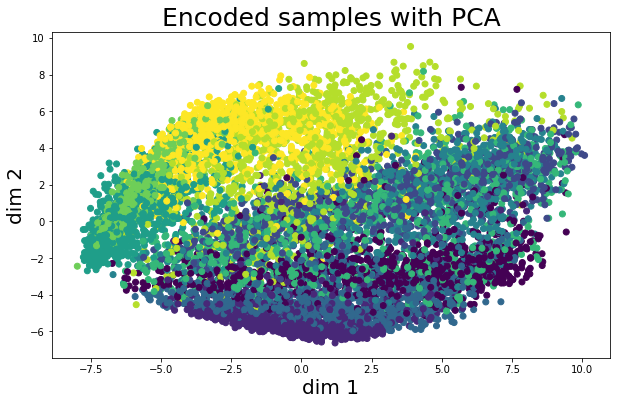

In [65]:
pca = PCA(n_components=2, random_state=seed)
samples_reduced_PCA = pca.fit_transform(data)

plt.figure(figsize=(10,6))
sc = plt.scatter(samples_reduced_PCA[:,0], samples_reduced_PCA[:,1], c=labels)
plt.xlabel('dim 1', fontsize=20)
plt.ylabel('dim 2', fontsize=20)
#lp = lambda i: plt.plot([], color=sc.cmap(sc.norm(i)), ms=np.sqrt(81), mec="none",
#                        label=label_names[i], ls="", marker="o")[0]
#handles = [lp(i) for i in labels]
#plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1, 0.5))
plt.title('Encoded samples with PCA', fontsize=25);

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



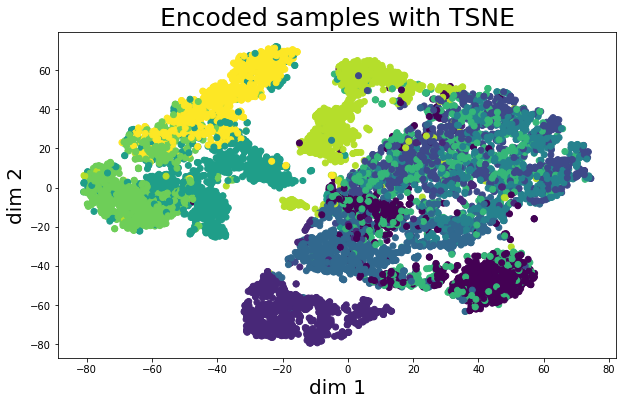

In [60]:
tsne = TSNE(n_components=2, init='pca', random_state=seed)
samples_reduced_TSNE = tsne.fit_transform(data)

plt.figure(figsize=(10,6))
plt.scatter(samples_reduced_TSNE[:,0], samples_reduced_TSNE[:,1], c=labels)
plt.xlabel('dim 1', fontsize=20)
plt.ylabel('dim 2', fontsize=20)
plt.title('Encoded samples with TSNE', fontsize=25);

# FINE-TUNING

In [8]:
### Download the data and create dataset
data_dir = 'dataset'

train_dataset = torchvision.datasets.FashionMNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST(data_dir, train=False, download=True)

# dataset transformations to fit the dim of resnet
train_transform = transforms.Compose([ 
    transforms.RandomRotation(degrees=np.random.randint(0,360)),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

# Set the transforms
train_dataset.transform = train_transform
test_dataset.transform = test_transform

N = len(train_dataset)
N_train = int(0.8*len(train_dataset))
N_val = N - N_train

### split the training set in train and validation
train, val = sklearn.model_selection.train_test_split(train_dataset, test_size=N_val, train_size=N_train, 
                                             random_state=seed, shuffle=True, stratify=None)

### Define the dataloaders
batch_size = 48
num_workers = 4

train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_dataloader  = DataLoader(val, batch_size=len(val), shuffle=False, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=num_workers)

batch_data, batch_labels = next(iter(train_dataloader))
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(val_dataloader))
print(f"VAL BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



TRAIN BATCH SHAPE
	 Data: torch.Size([48, 1, 28, 28])
	 Labels: torch.Size([48])
VAL BATCH SHAPE
	 Data: torch.Size([12000, 1, 28, 28])
	 Labels: torch.Size([12000])
TEST BATCH SHAPE
	 Data: torch.Size([10000, 1, 28, 28])
	 Labels: torch.Size([10000])


In [9]:
label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']

# Defining the function for plotting the confusion matrix
def show_cm(valid, predict):
    matrix = confusion_matrix(valid, predict, normalize='true')
    plt.figure(figsize = (12,8))
    seaborn.heatmap(matrix,
                   xticklabels = label_names,
                   yticklabels = label_names,
                   annot = True,
                   #fmt = 'd',
                   linecolor = 'white',
                   linewidths = 1,
                   cmap='Blues')
    plt.title('Confusion Matrix', fontsize=20)
    plt.ylabel('True label', fontsize=15)
    plt.xlabel('Predicted label', fontsize=15)
    plt.show()

    return matrix

## Autoencoder Fine-tuning

In [ ]:
### Load the encoder
encoder = Encoder(chs=(1,8,16,32,38))

fold_n = 4
### load best fols encoder
encoder_load_path = f'./encoder-fold-{fold_n}.pth'
encoder.load_state_dict(torch.load(encoder_load_path))

<All keys matched successfully>

In [ ]:
class Autoencoder_classifier(nn.Module):
    
    def __init__(self, out_dim=10, dropout_p=0.2):
        super(Autoencoder_classifier, self).__init__() 
        
        #self.fc1 = nn.Linear(2, Nh1)
        self.out = nn.Linear(38, out_dim)
        self.dropout = nn.Dropout(dropout_p)
        
    def forward(self, x):
        #x = self.dropout(self.fc1(x))
        out = self.out(x)
        return out

In [ ]:
encoder_classif = Autoencoder_classifier()

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

encoder_classif.to(device)
encoder.to(device)

opt_cassif = optim.Adam(encoder_classif.parameters(), lr=0.0001, weight_decay=0.0005)
opt_encoder = optim.Adam(encoder.parameters(), lr=0.0001, weight_decay=0.0005)

# loss function
loss_fn = nn.CrossEntropyLoss()

Selected device: cuda


In [ ]:
torch.manual_seed(seed)

### Training loop
num_epochs = 30

history = {'train_accuracy': [],
           'train_loss' : [],
           'val_accuracy': [],
           'val_loss' : []}

start = time.time()
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training
    # Set train mode 
    encoder.train()
    encoder_classif.train()
    
    for image_batch, label_batch in tqdm(train_dataloader): 
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode data
        out = encoder_classif(encoder(image_batch))

        # Evaluate loss
        train_loss = loss_fn(out, label_batch)

        # Backward pass
        opt_encoder.zero_grad()
        opt_cassif.zero_grad()
        train_loss.backward()
        opt_encoder.step()
        opt_cassif.step()
    
    x_test, y_test = next(iter(train_dataloader))
    y_pred = (encoder_classif(encoder(x_test.to(device))).argmax(dim=1))
    y_pred = y_pred.cpu()
    train_acc = 0
    for i in range(len(y_test)):
      if y_test[i] == y_pred[i]: train_acc+=1
    train_acc = train_acc/len(y_test)*100
    
    ### Validation
    # Set evaluation mode 
    encoder.eval()
    encoder_classif.eval()

    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, label_batch in tqdm(val_dataloader):
            # Move tensor to the proper device
            image_batch = image_batch.to(device)

            # Encode data
            out = encoder_classif(encoder(image_batch))

            # Append the network output and the original image to the lists
            conc_out.append(out.cpu())
            conc_label.append(label_batch)

        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label)

        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    
    x_test, y_test = next(iter(val_dataloader))
    y_pred = (encoder_classif(encoder(x_test.to(device))).argmax(dim=1))
    y_pred = y_pred.cpu()
    val_acc = 0
    for i in range(len(y_test)):
      if y_test[i] == y_pred[i]: val_acc+=1
    val_acc = val_acc/len(y_test)*100

    # Print loss and accuracy
    print('\n\n\t TRAINING   - EPOCH %d/%d - loss: %0.3f - acc: %0.1f %%' % (epoch + 1, num_epochs, train_loss, train_acc))
    print('\t VALIDATION - EPOCH %d/%d - loss: %0.3f - acc: %0.1f %%\n\n' % (epoch + 1, num_epochs, val_loss, val_acc))

    # save accuracy and loss for train and validation
    history['train_accuracy'].append(train_acc)
    history['train_loss'].append(train_loss.cpu().detach().numpy())
    history['val_accuracy'].append(val_acc)
    history['val_loss'].append(val_loss.cpu())

end = time.time()
print(f'Total training time: %0.2f' %(end-start))

EPOCH 1/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 1/30 - loss: 0.839 - acc: 52.1 %
	 VALIDATION - EPOCH 1/30 - loss: 0.875 - acc: 70.2 %


EPOCH 2/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 2/30 - loss: 0.488 - acc: 81.2 %
	 VALIDATION - EPOCH 2/30 - loss: 0.681 - acc: 75.3 %


EPOCH 3/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 3/30 - loss: 0.714 - acc: 70.8 %
	 VALIDATION - EPOCH 3/30 - loss: 0.613 - acc: 77.0 %


EPOCH 4/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 4/30 - loss: 0.665 - acc: 70.8 %
	 VALIDATION - EPOCH 4/30 - loss: 0.573 - acc: 78.6 %


EPOCH 5/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 5/30 - loss: 0.718 - acc: 75.0 %
	 VALIDATION - EPOCH 5/30 - loss: 0.544 - acc: 80.0 %


EPOCH 6/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 6/30 - loss: 0.628 - acc: 77.1 %
	 VALIDATION - EPOCH 6/30 - loss: 0.516 - acc: 81.0 %


EPOCH 7/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 7/30 - loss: 0.457 - acc: 89.6 %
	 VALIDATION - EPOCH 7/30 - loss: 0.499 - acc: 81.6 %


EPOCH 8/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 8/30 - loss: 0.587 - acc: 83.3 %
	 VALIDATION - EPOCH 8/30 - loss: 0.482 - acc: 82.4 %


EPOCH 9/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 9/30 - loss: 0.630 - acc: 81.2 %
	 VALIDATION - EPOCH 9/30 - loss: 0.470 - acc: 82.9 %


EPOCH 10/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 10/30 - loss: 0.599 - acc: 81.2 %
	 VALIDATION - EPOCH 10/30 - loss: 0.459 - acc: 83.2 %


EPOCH 11/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 11/30 - loss: 0.616 - acc: 72.9 %
	 VALIDATION - EPOCH 11/30 - loss: 0.449 - acc: 83.7 %


EPOCH 12/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 12/30 - loss: 0.688 - acc: 77.1 %
	 VALIDATION - EPOCH 12/30 - loss: 0.444 - acc: 83.8 %


EPOCH 13/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 13/30 - loss: 0.399 - acc: 83.3 %
	 VALIDATION - EPOCH 13/30 - loss: 0.433 - acc: 84.4 %


EPOCH 14/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 14/30 - loss: 0.430 - acc: 89.6 %
	 VALIDATION - EPOCH 14/30 - loss: 0.429 - acc: 84.5 %


EPOCH 15/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 15/30 - loss: 0.390 - acc: 81.2 %
	 VALIDATION - EPOCH 15/30 - loss: 0.427 - acc: 84.7 %


EPOCH 16/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 16/30 - loss: 0.265 - acc: 79.2 %
	 VALIDATION - EPOCH 16/30 - loss: 0.427 - acc: 84.8 %


EPOCH 17/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 17/30 - loss: 0.535 - acc: 85.4 %
	 VALIDATION - EPOCH 17/30 - loss: 0.421 - acc: 84.9 %


EPOCH 18/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 18/30 - loss: 0.482 - acc: 85.4 %
	 VALIDATION - EPOCH 18/30 - loss: 0.419 - acc: 84.8 %


EPOCH 19/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 19/30 - loss: 0.319 - acc: 85.4 %
	 VALIDATION - EPOCH 19/30 - loss: 0.412 - acc: 85.2 %


EPOCH 20/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 20/30 - loss: 0.435 - acc: 85.4 %
	 VALIDATION - EPOCH 20/30 - loss: 0.411 - acc: 85.0 %


EPOCH 21/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 21/30 - loss: 0.367 - acc: 91.7 %
	 VALIDATION - EPOCH 21/30 - loss: 0.405 - acc: 85.5 %


EPOCH 22/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 22/30 - loss: 0.421 - acc: 81.2 %
	 VALIDATION - EPOCH 22/30 - loss: 0.405 - acc: 85.5 %


EPOCH 23/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 23/30 - loss: 0.460 - acc: 85.4 %
	 VALIDATION - EPOCH 23/30 - loss: 0.406 - acc: 85.4 %


EPOCH 24/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 24/30 - loss: 0.393 - acc: 85.4 %
	 VALIDATION - EPOCH 24/30 - loss: 0.401 - acc: 85.7 %


EPOCH 25/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 25/30 - loss: 0.420 - acc: 85.4 %
	 VALIDATION - EPOCH 25/30 - loss: 0.402 - acc: 85.6 %


EPOCH 26/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 26/30 - loss: 0.312 - acc: 85.4 %
	 VALIDATION - EPOCH 26/30 - loss: 0.401 - acc: 85.7 %


EPOCH 27/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 27/30 - loss: 0.293 - acc: 77.1 %
	 VALIDATION - EPOCH 27/30 - loss: 0.397 - acc: 85.9 %


EPOCH 28/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 28/30 - loss: 0.545 - acc: 83.3 %
	 VALIDATION - EPOCH 28/30 - loss: 0.401 - acc: 85.8 %


EPOCH 29/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 29/30 - loss: 0.466 - acc: 89.6 %
	 VALIDATION - EPOCH 29/30 - loss: 0.399 - acc: 85.7 %


EPOCH 30/30


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 30/30 - loss: 0.304 - acc: 75.0 %
	 VALIDATION - EPOCH 30/30 - loss: 0.396 - acc: 85.9 %


Total training time: 251.59


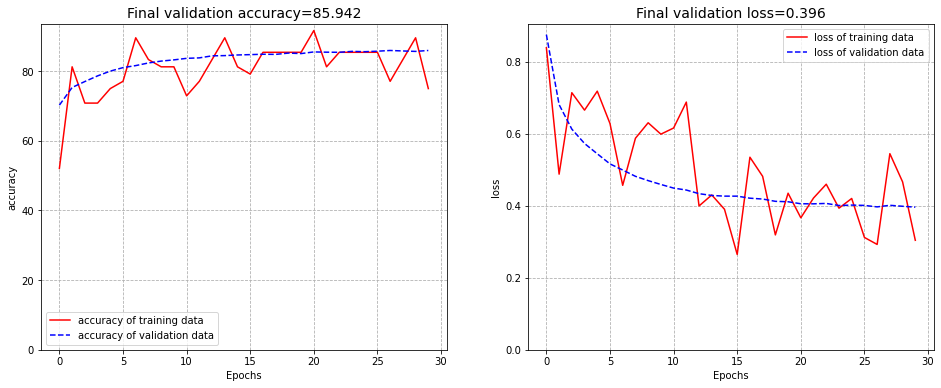

In [ ]:
fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(16,6))
count=0
for obs in ('accuracy','loss'):
    ax[count].plot(history['train_' + obs], 'r', label = obs + ' of training data')
    ax[count].plot(history['val_' + obs], 'b--', label = obs + ' of validation data')
    ax[count].set_ylabel(obs)
    ax[count].set_xlabel('Epochs')
    ax[count].legend()
    ax[count].set_ylim(0)
    ax[count].grid(linestyle='--')
    ax[count].set_title('Final validation {}={:.3f}' .format(obs,history['val_'+obs][-1]),
                        fontsize=14)
    count+=1
plt.show()

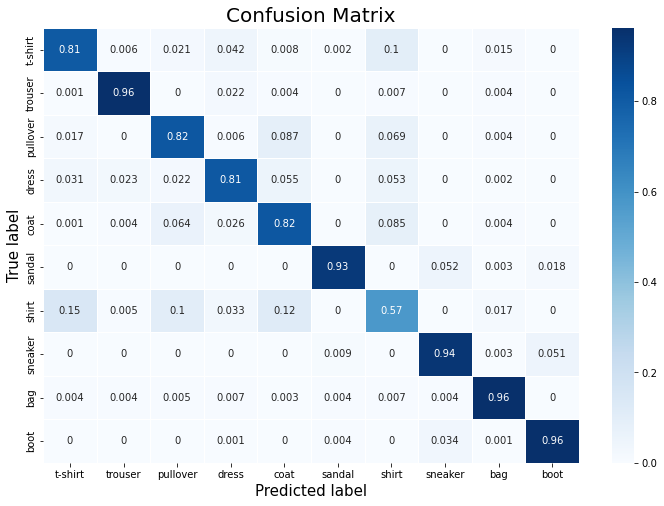

In [ ]:
# Initialize the prediction and label lists(tensors)
pred_list = torch.zeros(0,dtype=torch.long, device='cpu')
lbl_list = torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(test_dataloader):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = encoder_classif(encoder(inputs))
        _, preds = torch.max(outputs, 1)

        # Append batch prediction results
        pred_list = torch.cat([pred_list,preds.view(-1).cpu()])
        lbl_list = torch.cat([lbl_list,classes.view(-1).cpu()])

# Confusion matrix
conf_mat = show_cm(lbl_list.numpy(), pred_list.numpy())

In [ ]:
# Per-class accuracy
class_accuracy = 100*conf_mat.diagonal()/conf_mat.sum(1)

pc = pd.DataFrame(class_accuracy, index=label_names, columns=['Accuracy per class(%)'])
pc

,Accuracy per class(%)
t-shirt,80.5
trouser,96.2
pullover,81.7
dress,81.4
coat,81.6
sandal,92.7
shirt,57.3
sneaker,93.7
bag,96.2
boot,96.0


In [ ]:
# Set evaluation mode 
encoder.eval()
encoder_classif.eval()

with torch.no_grad(): # No need to track the gradients
    # Define the lists to store the outputs for each batch
    conc_out = []
    conc_label = []
    for image_batch, label_batch in tqdm(test_dataloader):
        # Move tensor to the proper device
        image_batch = image_batch.to(device)

        # Encode data
        out = encoder_classif(encoder(image_batch))
        # Append the network output and the original image to the lists
        conc_out.append(out.cpu())
        conc_label.append(label_batch)

    # Create a single tensor with all the values in the lists
    conc_out = torch.cat(conc_out)
    conc_label = torch.cat(conc_label)

    # Evaluate global loss
    test_loss = loss_fn(conc_out, conc_label)

print('\n-----FINAL RESULTS-----')
print(f'TEST LOSS: %0.3f' % test_loss)
print(f'TEST ACCURACY: %0.1f %%' % np.mean(class_accuracy))

  0%|          | 0/1 [00:00<?, ?it/s]


-----FINAL RESULTS-----
TEST LOSS: 0.410
TEST ACCURACY: 85.7 %


## ResNet 18 Fine-tuning

In [14]:
### Download the data and create dataset
data_dir = 'dataset'

train_dataset = torchvision.datasets.FashionMNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST(data_dir, train=False, download=True)

# dataset transformations to fit the dim of resnet
train_transform = transforms.Compose([ 
    transforms.RandomRotation(degrees=np.random.randint(0,360)),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(), 
    transforms.Normalize((0.5,), (0.5,)),
    transforms.Lambda(lambda x: x.repeat(3, 1, 1)),
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
    transforms.Lambda(lambda x: x.repeat(3, 1, 1)),
])

# Set the transforms
train_dataset.transform = train_transform
test_dataset.transform = test_transform

N = len(train_dataset)
N_train = int(0.8*len(train_dataset))
N_val = N - N_train

### split the training set in train and validation
train, val = sklearn.model_selection.train_test_split(train_dataset, test_size=N_val, train_size=N_train, 
                                             random_state=seed, shuffle=True, stratify=None)

### Define the dataloaders
batch_size = 300
num_workers = 2

train_dataloader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_dataloader  = DataLoader(val, batch_size=len(val), shuffle=False, num_workers=num_workers)
test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=num_workers)


batch_data, batch_labels = next(iter(train_dataloader))
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(val_dataloader))
print(f"VAL BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

TRAIN BATCH SHAPE
	 Data: torch.Size([300, 3, 28, 28])
	 Labels: torch.Size([300])
VAL BATCH SHAPE
	 Data: torch.Size([12000, 3, 28, 28])
	 Labels: torch.Size([12000])
TEST BATCH SHAPE
	 Data: torch.Size([10000, 3, 28, 28])
	 Labels: torch.Size([10000])


### Model definition

In [10]:
class ResNetFeatrueExtractor18(nn.Module):
    def __init__(self, pretrained = True):
        super(ResNetFeatrueExtractor18, self).__init__()
        model_resnet18 = torchvision.models.resnet18(pretrained=pretrained)
        self.conv1 = model_resnet18.conv1
        self.bn1 = model_resnet18.bn1
        self.relu = model_resnet18.relu
        self.maxpool = model_resnet18.maxpool
        self.layer1 = model_resnet18.layer1
        self.layer2 = model_resnet18.layer2
        self.layer3 = model_resnet18.layer3
        self.layer4 = model_resnet18.layer4
        self.avgpool = model_resnet18.avgpool

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)

        return x

class ResClassifier(nn.Module):
    def __init__(self, Nh1=70, dropout_p=0.2): #in_features=512
        super(ResClassifier, self).__init__() 
        
        self.fc1 = nn.Linear(512, Nh1)
        self.out = nn.Linear(Nh1, 10)
        self.dropout = nn.Dropout(dropout_p)
        
    def forward(self, x):
        x = self.dropout(self.fc1(x))
        out = self.out(x)
        return out

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.xavier_uniform_(m.weight)
    elif classname.find('Linear') != -1:
        torch.nn.init.xavier_uniform_(m.weight)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.01)

In [11]:
torch.manual_seed(seed)

### Training function
def train_epoch(netG, netF, device, dataloader, loss_fn, optimizerG, optimizerF, sparsity=False, reg_param=0.001, verbose=0):
    # Set train mode 
    netG.train()
    netF.train()
    
    for image_batch, label_batch in tqdm(dataloader): 
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode data
        out = netF(netG(image_batch))

        # Evaluate loss
        loss = loss_fn(out, label_batch)

        if sparsity:
            l1_loss = sparse_loss(model)
            # add the sparsity penalty
            loss = loss + reg_param*l1_loss

        # Backward pass
        optimizerG.zero_grad()
        optimizerF.zero_grad()
        loss.backward()
        optimizerG.step()
        optimizerF.step()

        # Print batch loss
        if verbose:
            print('\t partial train loss (single batch): %f' % (loss.data))

    return loss.data

### Testing function
def test_epoch(netG, netF, device, dataloader, loss_fn):
    # Set evaluation mode 
    netG.eval()
    netF.eval()

    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, label_batch in tqdm(dataloader):
            # Move tensor to the proper device
            image_batch = image_batch.to(device)

            # Encode data
            out = netF(netG(image_batch))

            # Append the network output and the original image to the lists
            conc_out.append(out.cpu())
            conc_label.append(label_batch)

        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label)

        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)

    return conc_out, conc_label, val_loss.data

### Training with pre-trained model

In [ ]:
netG = ResNetFeatrueExtractor18(pretrained = True)
netF = ResClassifier()

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

netG.to(device)
netF.to(device)

# setting up optimizer for both feature generator G and classifier F.
opt_g = optim.Adam(netG.parameters(), lr=0.001, weight_decay=0.0005)
opt_f = optim.Adam(netF.parameters(), lr=0.001, weight_decay=0.0005)

# loss function
loss_fn = nn.CrossEntropyLoss()

Selected device: cuda


In [ ]:
torch.manual_seed(seed)

### Training loop
num_epochs = 15

history = {'train_accuracy': [],
           'train_loss' : [],
           'val_accuracy': [],
           'val_loss' : []}

start = time.time()
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training
    train_loss = train_epoch(
        netG=netG, netF=netF,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizerG=opt_g, optimizerF=opt_f,
        sparsity=False, reg_param=0.001)
    
    x_test, y_test = next(iter(train_dataloader))
    y_pred = (netF(netG(x_test.to(device))).argmax(dim=1))
    y_pred = y_pred.cpu()
    train_acc = 0
    for i in range(len(y_test)):
      if y_test[i] == y_pred[i]: train_acc+=1
    train_acc = train_acc/len(y_test)*100
    
    ### Validation
    _, _, val_loss = test_epoch(
        netG=netG, netF=netF,
        device=device, 
        dataloader=val_dataloader, 
        loss_fn=loss_fn)
    
    x_test, y_test = next(iter(val_dataloader))
    y_pred = (netF(netG(x_test.to(device))).argmax(dim=1))
    y_pred = y_pred.cpu()
    val_acc = 0
    for i in range(len(y_test)):
      if y_test[i] == y_pred[i]: val_acc+=1
    val_acc = val_acc/len(y_test)*100

    # Print loss and accuracy
    print('\n\n\t TRAINING   - EPOCH %d/%d - loss: %0.3f - acc: %0.1f %%' % (epoch + 1, num_epochs, train_loss, train_acc))
    print('\t VALIDATION - EPOCH %d/%d - loss: %0.3f - acc: %0.1f %%\n\n' % (epoch + 1, num_epochs, val_loss, val_acc))

    # save accuracy and loss for train and validation
    history['train_accuracy'].append(train_acc)
    history['train_loss'].append(train_loss.cpu().detach().numpy())
    history['val_accuracy'].append(val_acc)
    history['val_loss'].append(val_loss.cpu())

end = time.time()
print(f'Total training time: %0.2f' %(end-start))

EPOCH 1/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 1/15 - loss: 0.547 - acc: 78.0 %
	 VALIDATION - EPOCH 1/15 - loss: 0.577 - acc: 79.0 %


EPOCH 2/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 2/15 - loss: 0.374 - acc: 85.0 %
	 VALIDATION - EPOCH 2/15 - loss: 0.518 - acc: 81.7 %


EPOCH 3/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 3/15 - loss: 0.485 - acc: 86.7 %
	 VALIDATION - EPOCH 3/15 - loss: 0.505 - acc: 82.3 %


EPOCH 4/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 4/15 - loss: 0.436 - acc: 84.3 %
	 VALIDATION - EPOCH 4/15 - loss: 0.518 - acc: 81.3 %


EPOCH 5/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 5/15 - loss: 0.411 - acc: 87.3 %
	 VALIDATION - EPOCH 5/15 - loss: 0.455 - acc: 83.8 %


EPOCH 6/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 6/15 - loss: 0.391 - acc: 89.0 %
	 VALIDATION - EPOCH 6/15 - loss: 0.500 - acc: 82.4 %


EPOCH 7/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 7/15 - loss: 0.285 - acc: 88.7 %
	 VALIDATION - EPOCH 7/15 - loss: 0.459 - acc: 84.1 %


EPOCH 8/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 8/15 - loss: 0.298 - acc: 89.0 %
	 VALIDATION - EPOCH 8/15 - loss: 0.467 - acc: 83.7 %


EPOCH 9/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 9/15 - loss: 0.317 - acc: 94.7 %
	 VALIDATION - EPOCH 9/15 - loss: 0.483 - acc: 83.7 %


EPOCH 10/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 10/15 - loss: 0.296 - acc: 90.7 %
	 VALIDATION - EPOCH 10/15 - loss: 0.478 - acc: 83.8 %


EPOCH 11/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 11/15 - loss: 0.278 - acc: 93.0 %
	 VALIDATION - EPOCH 11/15 - loss: 0.483 - acc: 83.9 %


EPOCH 12/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 12/15 - loss: 0.267 - acc: 92.3 %
	 VALIDATION - EPOCH 12/15 - loss: 0.512 - acc: 83.4 %


EPOCH 13/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 13/15 - loss: 0.240 - acc: 94.3 %
	 VALIDATION - EPOCH 13/15 - loss: 0.485 - acc: 84.2 %


EPOCH 14/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 14/15 - loss: 0.196 - acc: 92.7 %
	 VALIDATION - EPOCH 14/15 - loss: 0.510 - acc: 83.8 %


EPOCH 15/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 15/15 - loss: 0.223 - acc: 97.0 %
	 VALIDATION - EPOCH 15/15 - loss: 0.522 - acc: 83.9 %


Total training time: 370.92


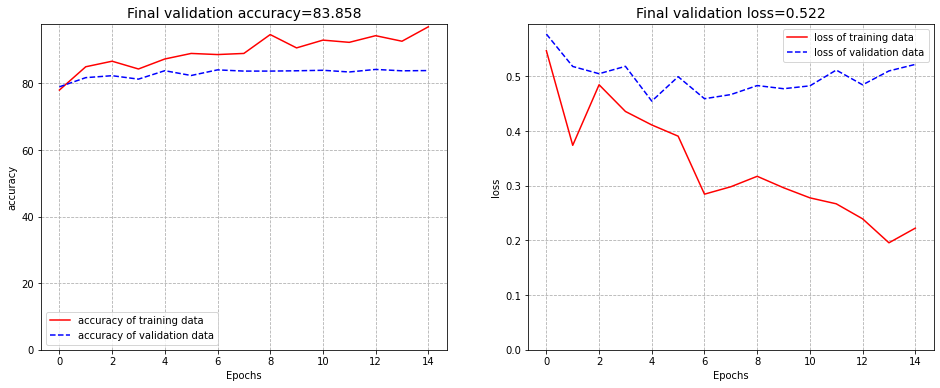

In [ ]:
fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(16,6))
count=0
for obs in ('accuracy','loss'):
    ax[count].plot(history['train_' + obs], 'r', label = obs + ' of training data')
    ax[count].plot(history['val_' + obs], 'b--', label = obs + ' of validation data')
    ax[count].set_ylabel(obs)
    ax[count].set_xlabel('Epochs')
    ax[count].legend()
    ax[count].set_ylim(0)
    ax[count].grid(linestyle='--')
    ax[count].set_title('Final validation {}={:.3f}' .format(obs,history['val_'+obs][-1]),
                        fontsize=14)
    count+=1
plt.show()

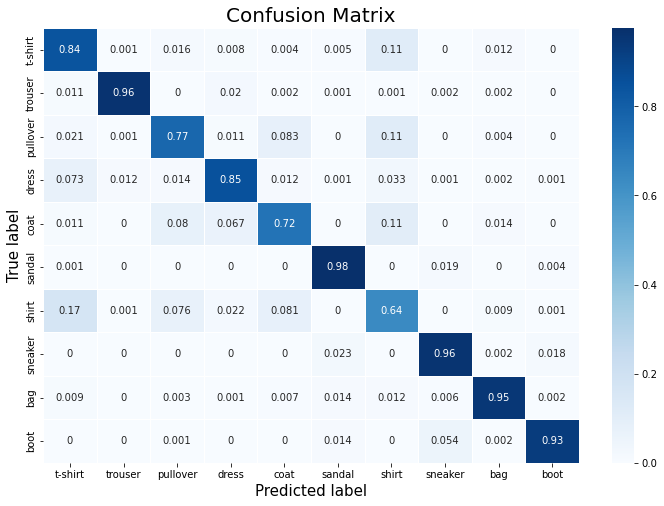

In [ ]:
# Initialize the prediction and label lists(tensors)
pred_list = torch.zeros(0,dtype=torch.long, device='cpu')
lbl_list = torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(test_dataloader):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = netF(netG(inputs))
        _, preds = torch.max(outputs, 1)

        # Append batch prediction results
        pred_list = torch.cat([pred_list,preds.view(-1).cpu()])
        lbl_list = torch.cat([lbl_list,classes.view(-1).cpu()])

# Confusion matrix
conf_mat = show_cm(lbl_list.numpy(), pred_list.numpy())

In [ ]:
# Per-class accuracy
class_accuracy = 100*conf_mat.diagonal()/conf_mat.sum(1)

pc = pd.DataFrame(class_accuracy, index=label_names, columns=['Accuracy per class(%)'])
pc

,Accuracy per class(%)
t-shirt,84.1
trouser,96.1
pullover,76.7
dress,85.1
coat,72.2
sandal,97.6
shirt,63.9
sneaker,95.7
bag,94.6
boot,92.9


In [ ]:
_, _, test_loss = test_epoch(
        netG=netG, netF=netF,
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)

print('\n-----FINAL RESULTS-----')
print(f'TEST LOSS: %0.3f' % test_loss)
print(f'TEST ACCURACY: %0.1f %%' % np.mean(class_accuracy))

  0%|          | 0/1 [00:00<?, ?it/s]


-----FINAL RESULTS-----
TEST LOSS: 0.482
TEST ACCURACY: 85.9 %


### Training with random weights

In [17]:
netG = ResNetFeatrueExtractor18(pretrained = False)
netF = ResClassifier()

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

netG.to(device)
netF.to(device)

# setting up optimizer for both feature generator G and classifier F.
opt_g = optim.Adam(netG.parameters(), lr=0.001, weight_decay=0.0005)
opt_f = optim.Adam(netF.parameters(), lr=0.001, weight_decay=0.0005)

# loss function
loss_fn = nn.CrossEntropyLoss()

Selected device: cuda


In [18]:
torch.manual_seed(seed)

### Training loop
num_epochs = 15

history = {'train_accuracy': [],
           'train_loss' : [],
           'val_accuracy': [],
           'val_loss' : []}

start = time.time()
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training
    train_loss = train_epoch(
        netG=netG, netF=netF,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizerG=opt_g, optimizerF=opt_f,
        sparsity=False, reg_param=0.001)
    
    x_test, y_test = next(iter(train_dataloader))
    y_pred = (netF(netG(x_test.to(device))).argmax(dim=1))
    y_pred = y_pred.cpu()
    train_acc = 0
    for i in range(len(y_test)):
      if y_test[i] == y_pred[i]: train_acc+=1
    train_acc = train_acc/len(y_test)*100
    
    ### Validation
    _, _, val_loss = test_epoch(
        netG=netG, netF=netF,
        device=device, 
        dataloader=val_dataloader, 
        loss_fn=loss_fn)
    
    x_test, y_test = next(iter(val_dataloader))
    y_pred = (netF(netG(x_test.to(device))).argmax(dim=1))
    y_pred = y_pred.cpu()
    val_acc = 0
    for i in range(len(y_test)):
      if y_test[i] == y_pred[i]: val_acc+=1
    val_acc = val_acc/len(y_test)*100

    # Print loss and accuracy
    print('\n\n\t TRAINING   - EPOCH %d/%d - loss: %0.3f - acc: %0.1f %%' % (epoch + 1, num_epochs, train_loss, train_acc))
    print('\t VALIDATION - EPOCH %d/%d - loss: %0.3f - acc: %0.1f %%\n\n' % (epoch + 1, num_epochs, val_loss, val_acc))

    # save accuracy and loss for train and validation
    history['train_accuracy'].append(train_acc)
    history['train_loss'].append(train_loss.cpu().detach().numpy())
    history['val_accuracy'].append(val_acc)
    history['val_loss'].append(val_loss.cpu())
    
end = time.time()
print(f'Total training time: %0.2f' %(end-start))

EPOCH 1/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 1/15 - loss: 0.865 - acc: 69.3 %
	 VALIDATION - EPOCH 1/15 - loss: 0.994 - acc: 66.1 %


EPOCH 2/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 2/15 - loss: 0.596 - acc: 74.0 %
	 VALIDATION - EPOCH 2/15 - loss: 0.768 - acc: 72.6 %


EPOCH 3/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 3/15 - loss: 0.589 - acc: 80.7 %
	 VALIDATION - EPOCH 3/15 - loss: 0.719 - acc: 74.2 %


EPOCH 4/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 4/15 - loss: 0.597 - acc: 82.7 %
	 VALIDATION - EPOCH 4/15 - loss: 0.671 - acc: 75.8 %


EPOCH 5/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 5/15 - loss: 0.610 - acc: 83.7 %
	 VALIDATION - EPOCH 5/15 - loss: 0.610 - acc: 78.1 %


EPOCH 6/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 6/15 - loss: 0.448 - acc: 84.3 %
	 VALIDATION - EPOCH 6/15 - loss: 0.586 - acc: 79.1 %


EPOCH 7/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 7/15 - loss: 0.419 - acc: 83.0 %
	 VALIDATION - EPOCH 7/15 - loss: 0.585 - acc: 79.0 %


EPOCH 8/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 8/15 - loss: 0.505 - acc: 86.0 %
	 VALIDATION - EPOCH 8/15 - loss: 0.644 - acc: 77.0 %


EPOCH 9/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 9/15 - loss: 0.451 - acc: 86.7 %
	 VALIDATION - EPOCH 9/15 - loss: 0.563 - acc: 80.0 %


EPOCH 10/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 10/15 - loss: 0.414 - acc: 85.7 %
	 VALIDATION - EPOCH 10/15 - loss: 0.556 - acc: 81.0 %


EPOCH 11/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 11/15 - loss: 0.448 - acc: 89.3 %
	 VALIDATION - EPOCH 11/15 - loss: 0.588 - acc: 80.0 %


EPOCH 12/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 12/15 - loss: 0.331 - acc: 91.0 %
	 VALIDATION - EPOCH 12/15 - loss: 0.601 - acc: 79.7 %


EPOCH 13/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 13/15 - loss: 0.315 - acc: 91.0 %
	 VALIDATION - EPOCH 13/15 - loss: 0.616 - acc: 78.7 %


EPOCH 14/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 14/15 - loss: 0.297 - acc: 93.7 %
	 VALIDATION - EPOCH 14/15 - loss: 0.573 - acc: 80.8 %


EPOCH 15/15


  0%|          | 0/160 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]



	 TRAINING   - EPOCH 15/15 - loss: 0.382 - acc: 90.7 %
	 VALIDATION - EPOCH 15/15 - loss: 0.608 - acc: 80.2 %


Total training time: 674.44


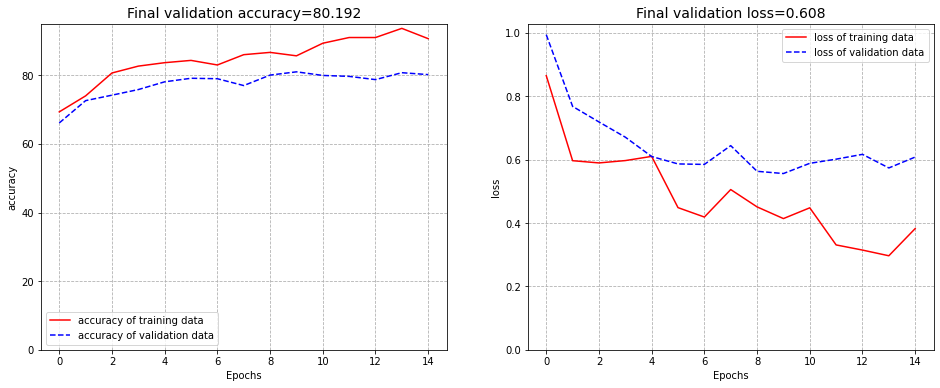

In [19]:
fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(16,6))
count=0
for obs in ('accuracy','loss'):
    ax[count].plot(history['train_' + obs], 'r', label = obs + ' of training data')
    ax[count].plot(history['val_' + obs], 'b--', label = obs + ' of validation data')
    ax[count].set_ylabel(obs)
    ax[count].set_xlabel('Epochs')
    ax[count].legend()
    ax[count].set_ylim(0)
    ax[count].grid(linestyle='--')
    ax[count].set_title('Final validation {}={:.3f}' .format(obs,history['val_'+obs][-1]),
                        fontsize=14)
    count+=1
plt.show()

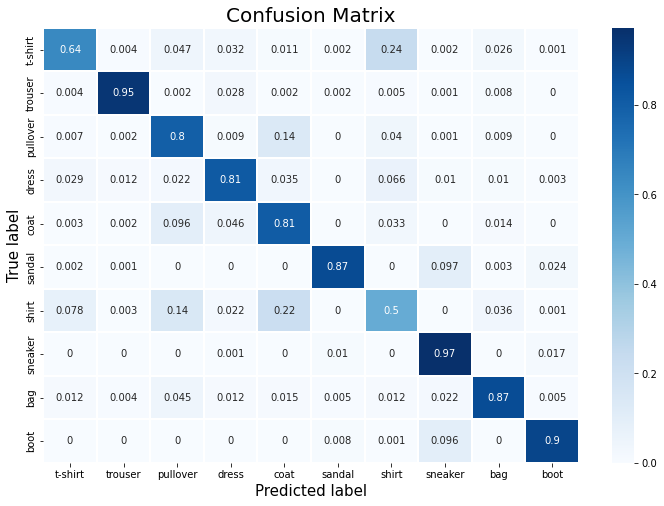

In [20]:
# Initialize the prediction and label lists(tensors)
pred_list = torch.zeros(0,dtype=torch.long, device='cpu')
lbl_list = torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(test_dataloader):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = netF(netG(inputs))
        _, preds = torch.max(outputs, 1)

        # Append batch prediction results
        pred_list = torch.cat([pred_list,preds.view(-1).cpu()])
        lbl_list = torch.cat([lbl_list,classes.view(-1).cpu()])

# Confusion matrix
conf_mat = show_cm(lbl_list.numpy(), pred_list.numpy())

In [21]:
# Per-class accuracy
class_accuracy = 100*conf_mat.diagonal()/conf_mat.sum(1)

pc = pd.DataFrame(class_accuracy, index=label_names, columns=['Accuracy per class(%)'])
pc

,Accuracy per class(%)
t-shirt,63.9
trouser,94.8
pullover,79.5
dress,81.3
coat,80.6
sandal,87.3
shirt,49.8
sneaker,97.2
bag,86.8
boot,89.5


In [22]:
_, _, test_loss = test_epoch(
        netG=netG, netF=netF,
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)

print('\n-----FINAL RESULTS-----')
print(f'TEST LOSS: %0.3f' % test_loss)
print(f'TEST ACCURACY: %0.1f %%' % np.mean(class_accuracy))

  0%|          | 0/1 [00:00<?, ?it/s]


-----FINAL RESULTS-----
TEST LOSS: 0.602
TEST ACCURACY: 81.1 %


## Comparison with Homework 1

In [23]:
test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

test_dataset  = torchvision.datasets.FashionMNIST(data_dir, train=False, download=True, transform=test_transform)

test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers=num_workers)

In [24]:
class CNNnet(nn.Module):
    
    def __init__(self, filters1=32, filters2=64, linear1=600, linear2=120, p=0.25):
        super().__init__()
        
        ### Convolutional section
        self.cnn = nn.Sequential(
            # first conv block
            nn.Conv2d(in_channels=1, out_channels=filters1, kernel_size=(3,3), padding=1),
            nn.BatchNorm2d(num_features=filters1),
            nn.ReLU(),
            nn.MaxPool2d((2,2), stride=2),
            # second conv block
            nn.Conv2d(in_channels=filters1, out_channels=filters2, kernel_size=(3,3)),
            nn.BatchNorm2d(num_features=filters2),
            nn.ReLU(),
            nn.MaxPool2d((2,2))
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.lin = nn.Sequential(
            nn.Linear(in_features=filters2*6*6, out_features=linear1), # filters2*7*7 = 784
            nn.Dropout2d(p),
            nn.Linear(in_features=linear1, out_features=linear2),
            nn.Linear(in_features=linear2, out_features=10)
        )
        
    def forward(self, x):
        # Apply convolutions
        x = self.cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.lin(x)
        return x

### Testing function
def test_epoch(model, device, dataloader, loss_fn):
    # Set evaluation mode 
    model.eval()

    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, label_batch in tqdm(dataloader):
            # Move tensor to the proper device
            image_batch = image_batch.to(device)

            # Encode data
            out = model(image_batch)

            # Append the network output and the original image to the lists
            conc_out.append(out.cpu())
            conc_label.append(label_batch)

        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label)

        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)

    return conc_out, conc_label, val_loss.data

In [25]:
params = {'batch_size': 300, 'p': 0.40, 'lr': 0.0085, 'optimizer': 'Adam', 'weight_decay': 0.00005, 'filters1': 35, 'filters2': 35, 'linear1': 375, 'linear2': 105}

In [26]:
torch.manual_seed(seed)

model = CNNnet(filters1= params['filters1'], filters2= params['filters2'], linear1= params['linear1'], linear2= params['linear2'], p= params['p'])

### Define the loss function
loss_fn = nn.CrossEntropyLoss()

### Define an optimizer
lr = params['lr'] # Learning rate
weight_decay =  params['weight_decay'] # l2 regularizer
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
model.to(device)

summary(model, (1,28,28))

Selected device: cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 35, 28, 28]             350
       BatchNorm2d-2           [-1, 35, 28, 28]              70
              ReLU-3           [-1, 35, 28, 28]               0
         MaxPool2d-4           [-1, 35, 14, 14]               0
            Conv2d-5           [-1, 35, 12, 12]          11,060
       BatchNorm2d-6           [-1, 35, 12, 12]              70
              ReLU-7           [-1, 35, 12, 12]               0
         MaxPool2d-8             [-1, 35, 6, 6]               0
           Flatten-9                 [-1, 1260]               0
           Linear-10                  [-1, 375]         472,875
        Dropout2d-11                  [-1, 375]               0
           Linear-12                  [-1, 105]          39,480
           Linear-13                   [-1, 10]           1,060
Total params: 524

In [30]:
# Load saved parameters of one fold of hw 1
fold_n = 2
# f'./fold_parameters/model-fold-{fold_n}.pth' to load the trained parameters in google cloud
load_path = f'/content/drive/MyDrive/università/Lab_NNDL/Homework 2-20211124/params/model-fold-{fold_n}.pth'
model.load_state_dict(torch.load(load_path))

<All keys matched successfully>

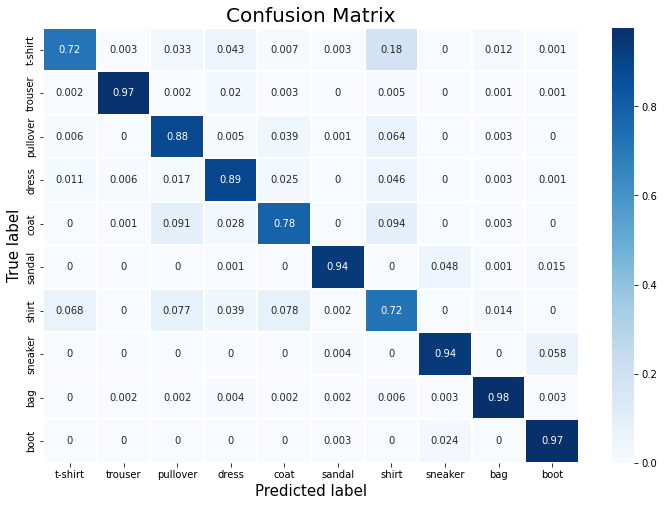

In [31]:
# Initialize the prediction and label lists(tensors)
pred_list = torch.zeros(0,dtype=torch.long, device='cpu')
lbl_list = torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(test_dataloader):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        # Append batch prediction results
        pred_list = torch.cat([pred_list,preds.view(-1).cpu()])
        lbl_list = torch.cat([lbl_list,classes.view(-1).cpu()])

# Confusion matrix
conf_mat = show_cm(lbl_list.numpy(), pred_list.numpy())

In [32]:
# Per-class accuracy
class_accuracy = 100*conf_mat.diagonal()/conf_mat.sum(1)

pc = pd.DataFrame(class_accuracy, index=label_names, columns=['Accuracy per class(%)'])
pc

,Accuracy per class(%)
t-shirt,71.8
trouser,96.6
pullover,88.2
dress,89.1
coat,78.3
sandal,93.5
shirt,72.2
sneaker,93.8
bag,97.6
boot,97.3


In [33]:
_, _, test_loss = test_epoch(
        model=model,
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)

print('\n-----FINAL RESULTS-----')
print(f'TEST LOSS: %0.3f' % test_loss)
print(f'TEST ACCURACY: %0.1f %%' % np.mean(class_accuracy))

  0%|          | 0/1 [00:00<?, ?it/s]


-----FINAL RESULTS-----
TEST LOSS: 0.318
TEST ACCURACY: 87.8 %
